# Multi Modal Model Training - Dependent Labels

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime
import re
import emoji

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
import transformers
from transformers import BertTokenizer, BertModel, BertConfig, AdamW
from transformers import DistilBertTokenizer, DistilBertModel, DistilBertConfig
from transformers import pipeline

In [3]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler, RandomSampler, SequentialSampler, ConcatDataset
from sklearn.model_selection import KFold
import skimage

## Setup

In [4]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [5]:
one_hot.classes_

array(['Appeal to (Strong) Emotions', 'Appeal to authority',
       'Appeal to fear/prejudice', 'Bandwagon',
       'Black-and-white Fallacy/Dictatorship',
       'Causal Oversimplification', 'Doubt', 'Exaggeration/Minimisation',
       'Flag-waving', 'Glittering generalities (Virtue)',
       'Loaded Language',
       "Misrepresentation of Someone's Position (Straw Man)",
       'Name calling/Labeling',
       'Obfuscation, Intentional vagueness, Confusion',
       'Presenting Irrelevant Data (Red Herring)', 'Reductio ad hitlerum',
       'Repetition', 'Slogans', 'Smears', 'Thought-terminating cliché',
       'Transfer', 'Whataboutism'], dtype=object)

In [6]:
from CustomLoader import MultiModalLoader

In [7]:
training_data = MultiModalLoader(json_file = 'MultiModal_training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = MultiModalLoader(json_file = 'MultiModal_testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [8]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 
# 

## Initialize Tokenizer

In [9]:
do_lower_case = True
model_type = 'distilbert'
model_version = 'distilbert-base-uncased'
tokenizer = DistilBertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)

# 
# 

## Define DistilBert Class

In [10]:
class DistilBertClass(nn.Module): ### INCLUDE TOKENIZER IN CLASS
    def __init__(self):
        super(DistilBertClass, self).__init__()
        
        ### Import DistilBert Model
        distilbert = transformers.DistilBertModel.from_pretrained("distilbert-base-uncased")
        
        ### Freeze parameters
        for param in distilbert.parameters():
            param.requires_grad = False
            
        ### DistilBert encoder
        self.distil = distilbert
                        
            
        self.pre_classifier = nn.Linear(770, 3072) #768
        
        self.fc2 = nn.Linear(3072, 1024)    
        self.fc3 = nn.Linear(1024, 512)
        self.fc4 = nn.Linear(512, 128)
        
#         self.classifier = nn.Linear(128, 22)
        
        self.dropout = nn.Dropout(0.01) #.3
        
        
    def forward(self, input_ids, attention_mask, hate, sent):

        ### Run DistilBert
        distil_output = self.distil(input_ids = input_ids, attention_mask = attention_mask)

        ### Grab hidden state
        hidden_state = distil_output[0]
        x1 = hidden_state[:, 0]
        

        # prepare hidden state to append additional features (hate and sentiment; hotencoded)
        x1 = x1.view(x1.size(0), -1)
        
        ### Bring in hate and sentiment
        x2 = hate
        x3 = sent

        ### Concatenate hidden state, hate, and sentiment
        x = torch.cat((x1, x2, x3), dim=1)

        ### Run through linear layers
        fc_output = x
        fc_output = self.pre_classifier(fc_output)

        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)

        fc_output = self.fc2(fc_output)
        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)

        #GELU

        fc_output = self.fc3(fc_output)
        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)


        fc_output = self.fc4(fc_output)
        fc_output = nn.Tanh()(fc_output)  # using gelu except for the last one to allow for classification
        fc_output = self.dropout(fc_output)

#         output = self.classifier(fc_output)


        return fc_output

# 
# 
# 

## Define CNN-RNN-DB Architectures (Set Hidden Size)

### ResNet18-LSTM-DB

In [11]:
### Define Class
class ResNet18_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM-DB

In [12]:
### Define Class
class ResNet50_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM-DB

In [13]:
### Define Class
class ResNet101_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM-DB

In [14]:
### Define Class
class DenseNet121_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM-DB

In [15]:
### Define Class
class DenseNet169_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM-DB

In [16]:
### Define Class
class DenseNet201_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM-DB

In [17]:
### Define Class
class VGG11_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM-DB

In [18]:
### Define Class
class VGG16_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM-DB

In [19]:
### Define Class
class VGG19_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [20]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [21]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN_DB(CNN = None, DistilBert = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((CNN == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None) or (DistilBert == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network1 = DistilBert
            network2 = CNN
            if torch.cuda.is_available():
                network1.cuda()
                network1 = nn.DataParallel(network1, list(range(2)))
                
                network2.cuda()
                network2 = nn.DataParallel(network2, list(range(2)))
                
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer1 = transformers.Adafactor(
                network1.parameters(),
                lr=None,  # when using warm up and relative step, LR is auto determined
                eps=(1e-30, 1e-3),
                clip_threshold=1.0,
                decay_rate=-0.8, #0.8
                beta1=None, # <- used for L1 regularization
                weight_decay=0.000002, # L2 regularization, to prevent overfitting  (beta2)
                relative_step=True,
                scale_parameter=True, # https://github.com/pytorch/pytorch/issues/25081 this setting keeps the gradients from reaching 0 (using the clip threshold) (if this is enabled, must modify in training)
                warmup_init=True
            )
                        
            optimizer2 = optim.Adam(network2.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer2, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network1.train()
                network2.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, text, hate, sent, targets = data[0].to(device), data[1], data[2].to(device), data[3].to(device), data[4].float().to(device)
                    
                    optimizer1.zero_grad()
                    optimizer2.zero_grad()
                    
                    
                    ids = []
                    mask = []

                    for j in text:   
                        inputs = tokenizer.encode_plus(
                                j, 
                                None,
                                add_special_tokens = True,    
                                max_length= 512,
                                padding = "max_length",
                                pad_to_max_length = True,
                                return_token_type_ids= False)

                        ids.append(inputs['input_ids'])
                        mask.append(inputs['attention_mask'])

                    ids = torch.from_numpy(np.array(ids)).to(device)
                    mask = torch.from_numpy(np.array(mask)).to(device)

                    distil_output = network1(ids, mask, hate, sent)

                    output = network2(images, distil_output)

                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer1.step()
                    optimizer2.step()
                    
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network1.eval()
                network2.eval()
                
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, text, hate, sent, targets = data[0].to(device), data[1], data[2].to(device), data[3].to(device), data[4].float().to(device)
                    
                    ids = []
                    mask = []
                    
                    for j in text:   
                        inputs = tokenizer.encode_plus(
                                j, 
                                None,
                                add_special_tokens = True,    
                                max_length= 512,
                                padding = "max_length",
                                pad_to_max_length = True,
                                return_token_type_ids= False)

                        ids.append(inputs['input_ids'])
                        mask.append(inputs['attention_mask'])

                    ids = torch.from_numpy(np.array(ids)).to(device)
                    mask = torch.from_numpy(np.array(mask)).to(device)

                    distil_output = network1(ids, mask, hate, sent)

                    output = network2(images, distil_output)
                    
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network1.state_dict(), 'BestCnnRnnDBModels/DB_' + model_name[:-3] + '.pt')
                    torch.save(network2.state_dict(), 'BestCnnRnnDBModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer2), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('MultiModal_DependentLabels_700_1_0_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0

In [22]:
DB_resnet18 = DistilBertClass()
DB_resnet50 = DistilBertClass()
DB_resnet101 = DistilBertClass()

DB_densenet121 = DistilBertClass()
DB_densenet169 = DistilBertClass()
DB_densenet201 = DistilBertClass()

DB_vgg11bn = DistilBertClass()
DB_vgg16bn = DistilBertClass()
DB_vgg19bn = DistilBertClass()

resnet18LSTM_700_1_0 = ResNet18_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet50LSTM_700_1_0 = ResNet50_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet101LSTM_700_1_0 = ResNet101_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)

densenet121LSTM_700_1_0 = DenseNet121_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet169LSTM_700_1_0 = DenseNet169_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet201LSTM_700_1_0 = DenseNet201_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)

vgg11bnLSTM_700_1_0 = VGG11_BN_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg16bnLSTM_700_1_0 = VGG16_BN_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg19bnLSTM_700_1_0 = VGG19_BN_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [23]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0177 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0683 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0512 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1237 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1116 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0472 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0459 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.57
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

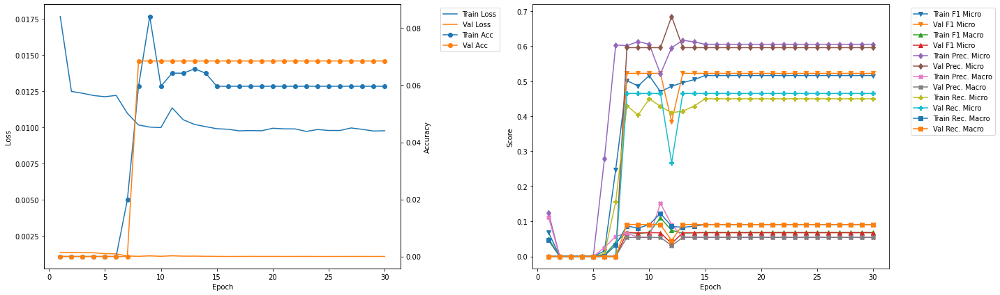

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.01
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.508 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6057 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4374 	Validation Recall Micro: 0.4244
Train Recall Marco: 0.0871 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.26
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5137 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.446 	V

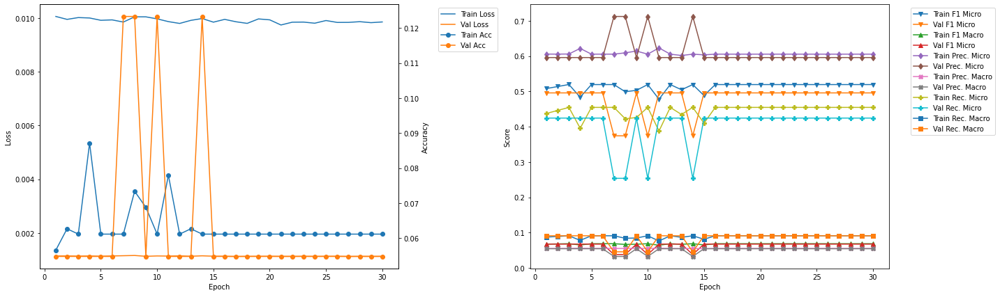

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.522523 --> 0.530973).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 15.71
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5153 	Validation F1 Micro: 0.531
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4498 	Validation Recall Micro: 0.4663
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.96
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0795 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4454 	Validation F1 Micro: 0.531
Train F1 Marco: 0.0597 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6305 	Validation Precision Micro: 0.6164
Train Precisi

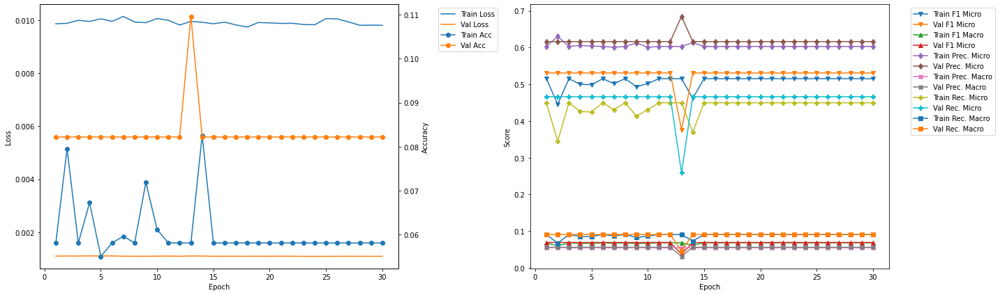

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.4
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4821 	Validation F1 Micro: 0.5072
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6125 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3975 	Validation Recall Micro: 0.4378
Train Recall Marco: 0.0785 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.65
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.5072
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.453 	Vali

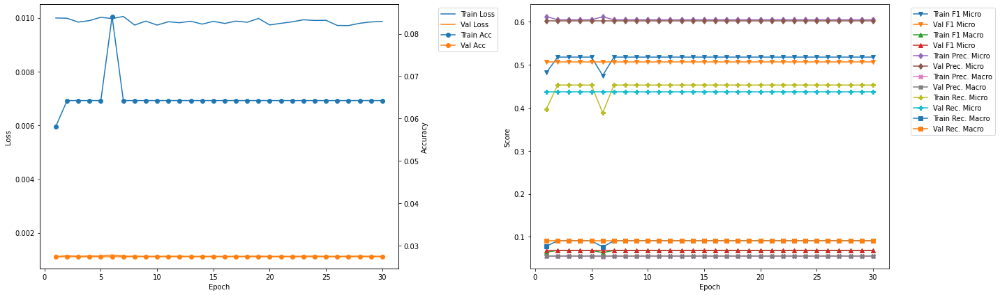

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.530973 --> 0.549133).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 31.1
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5491
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4488 	Validation Recall Micro: 0.475
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.36
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5491
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Precision

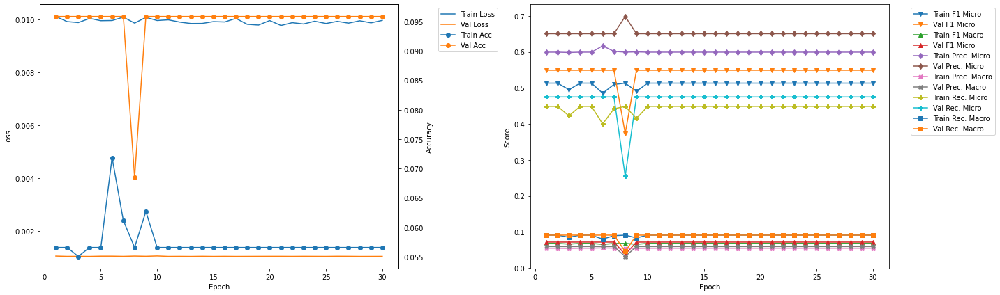

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.8
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5196 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4533 	Validation Recall Micro: 0.4346
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.05
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5196 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4533 	Val

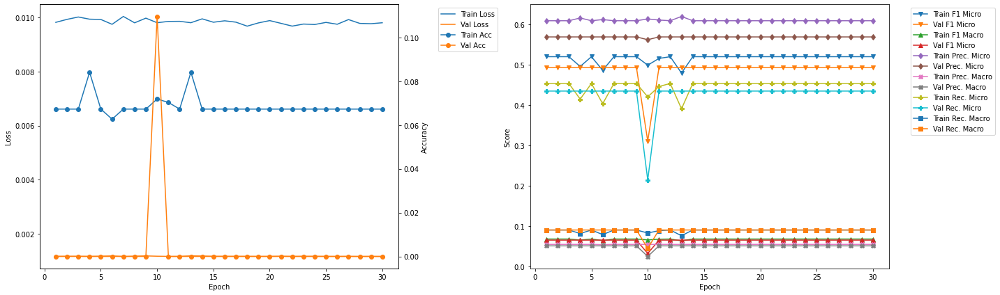

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.49
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4913 	Validation F1 Micro: 0.3984
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.4104 	Validation Recall Micro: 0.2787
Train Recall Marco: 0.0826 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.74
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4939 	Validation F1 Micro: 0.5471
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4161 	Val

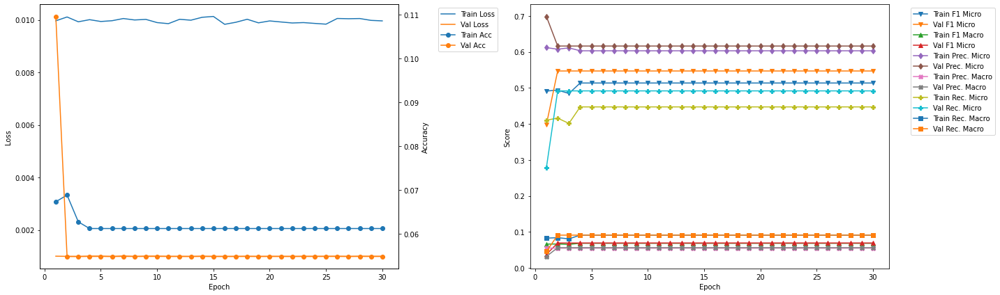

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.18
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5183 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4527 	Validation Recall Micro: 0.4404
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.43
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5183 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4527

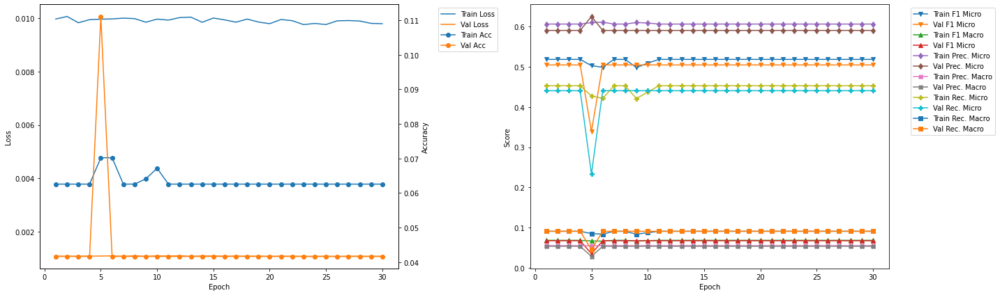

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 61.86
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4513 	Validation Recall Micro: 0.4531
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 62.12
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4885 	Validation F1 Micro: 0.5179
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4057 

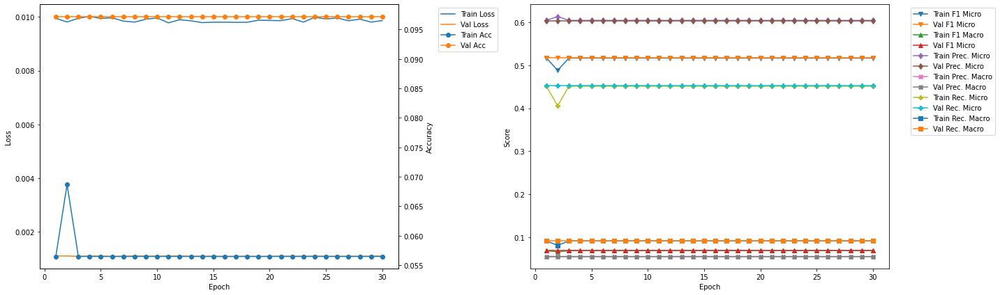

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.55
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5185 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4539 	Validation Recall Micro: 0.4307
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.81
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5092 	Validation F1 Micro: 0.5029
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.4384

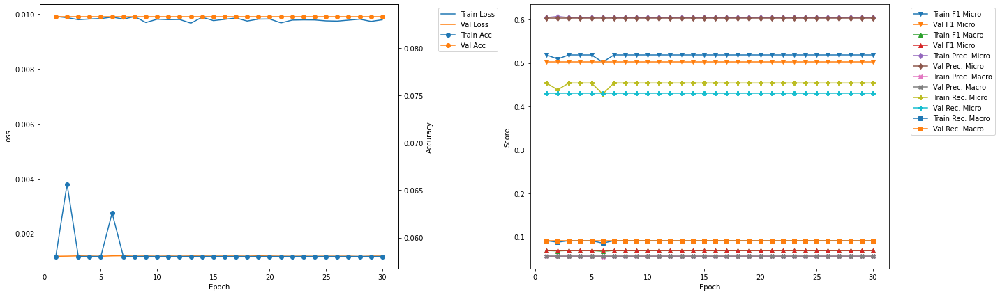

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 1
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5491
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.5994 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4488 	Validation Recall Micro: 0.475
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909


In [24]:
resnet18LSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = resnet18LSTM_700_1_0, DistilBert = DB_resnet18,
                                                training_data = training_data, learning_rate = 0.01,
                                                k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0235 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0731 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0489 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1135 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1237 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0539 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0461 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.56
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

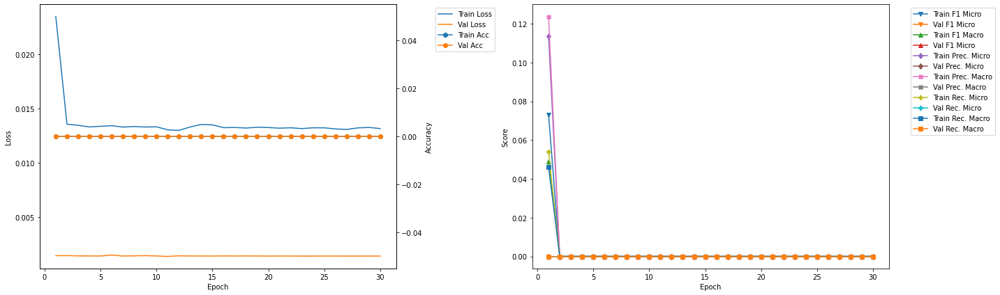

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.61
Train Loss: 0.015 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0616 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0494 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1397 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1266 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0395 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0437 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.89
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

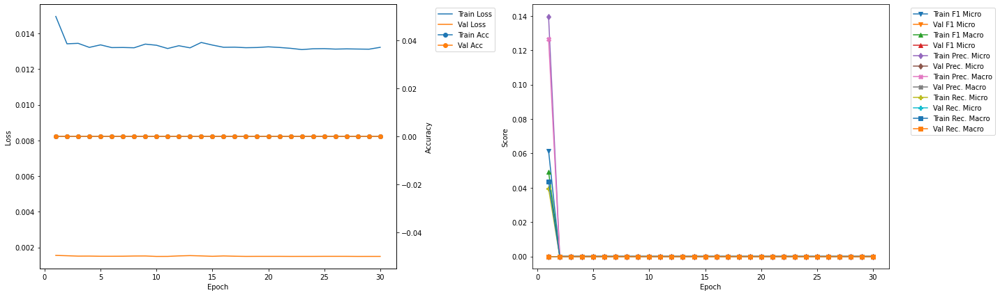

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.95
Train Loss: 0.0139 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.22
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

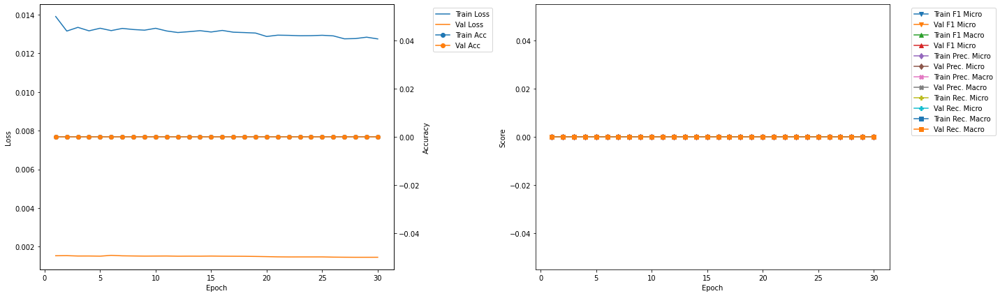

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.29
Train Loss: 0.013 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.57
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall 

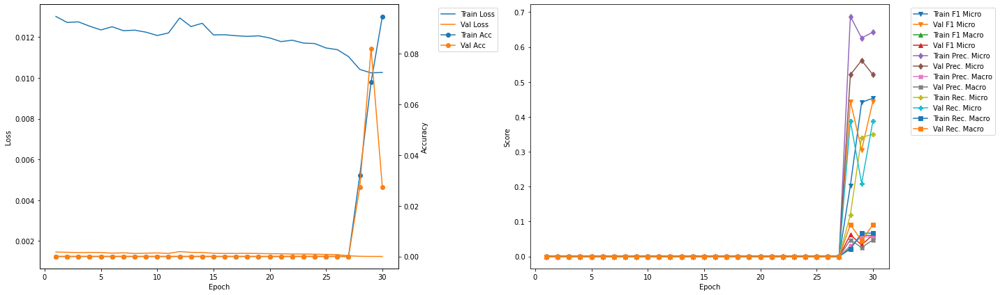

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.63
Train Loss: 0.013 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0518 	Validation F1 Micro: 0.0
Train F1 Marco: 0.01 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.48 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0412 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0274 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0059 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.91
Train Loss: 0.0118 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

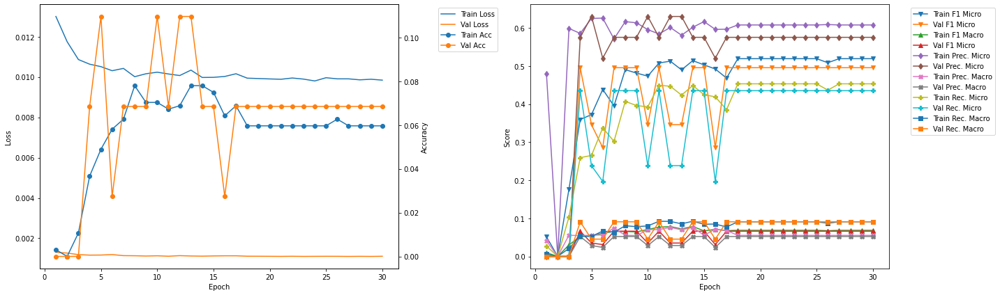

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.495575 --> 0.552941).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 41.99
Train Loss: 0.011 	Validation Loss: 0.0011
Train Accuracy: 0.0459 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4143 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5675 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0748 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3263 	Validation Recall Micro: 0.4845
Train Recall Marco: 0.0686 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.27
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4843 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6438
Train Precisi

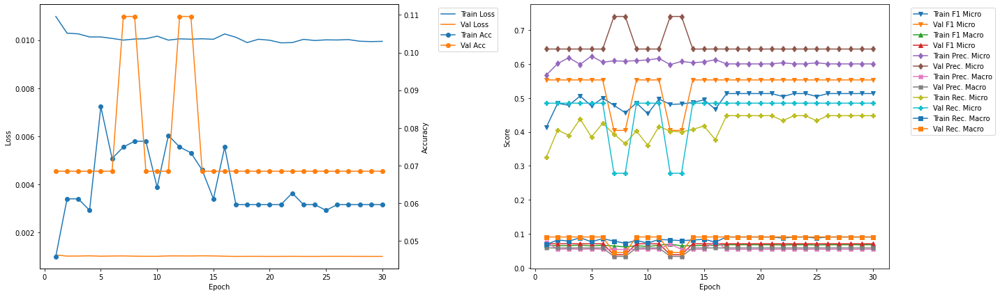

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.33
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.476 	Validation F1 Micro: 0.5251
Train F1 Marco: 0.0693 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0712 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3951 	Validation Recall Micro: 0.4611
Train Recall Marco: 0.0801 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4869 	Validation F1 Micro: 0.3684
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4071 	

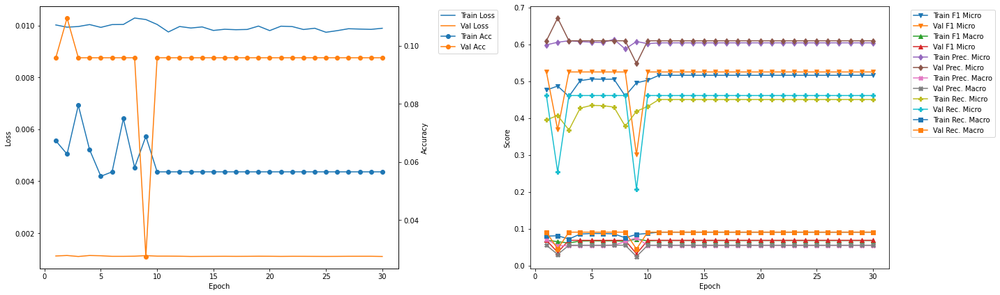

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 58.66
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0824 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.3469
Train F1 Marco: 0.0733 	Validation F1 Macro: 0.0359
Train Precision Mirco: 0.5922 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0708 	Validation Precision Macro: 0.0297
Train Recall Mirco: 0.393 	Validation Recall Micro: 0.2362
Train Recall Marco: 0.0807 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 58.94
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4896 	Validation F1 Micro: 0.5248
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0699
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4108

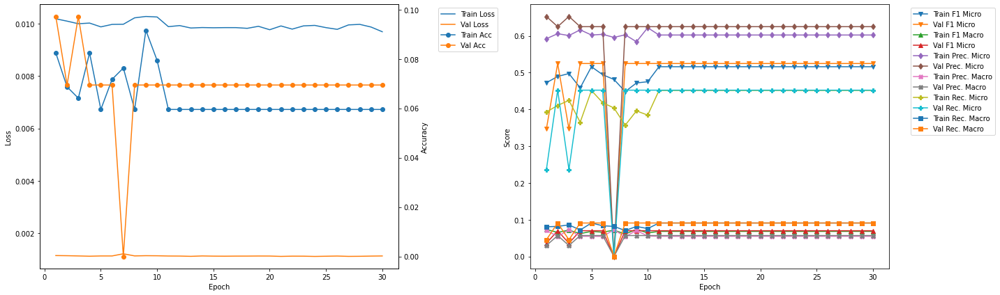

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 67.0
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.4177
Train F1 Marco: 0.0781 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.5837 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.078 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.4237 	Validation Recall Micro: 0.2938
Train Recall Marco: 0.0893 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 67.28
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.484 	Validation F1 Micro: 0.5483
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4006 	Va

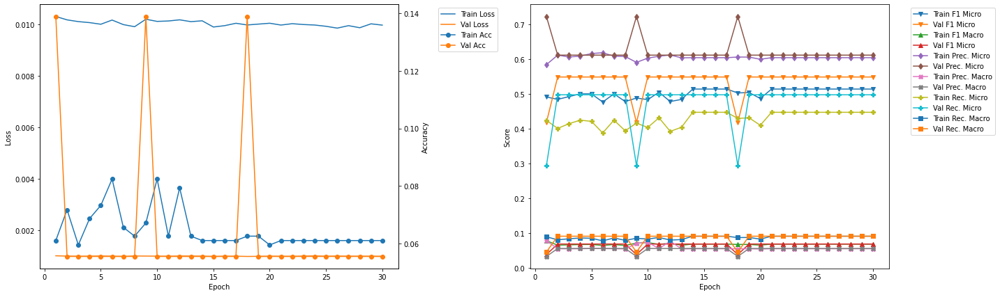

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 75.33
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.465 	Validation F1 Micro: 0.4828
Train F1 Marco: 0.0715 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.5819 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0727 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.3873 	Validation Recall Micro: 0.4118
Train Recall Marco: 0.0792 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 75.61
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.058 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.5028 	Validation F1 Micro: 0.4828
Train F1 Marco: 0.0692 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0592 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.4332 	V

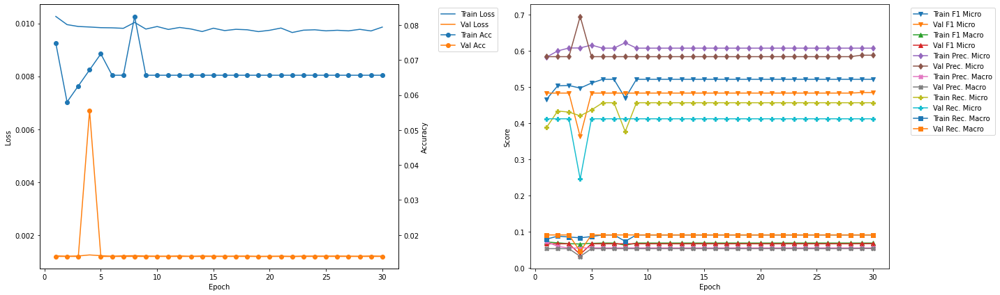

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 1
Train Loss: 0.011 	Validation Loss: 0.0011
Train Accuracy: 0.0459 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4143 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5675 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0748 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.3263 	Validation Recall Micro: 0.4845
Train Recall Marco: 0.0686 	Validation Recall Macro: 0.0909


In [25]:
resnet50LSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = resnet50LSTM_700_1_0, DistilBert = DB_resnet50, 
                                                training_data = training_data, learning_rate = 0.01, 
                                                k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0158 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0085 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0087 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0734 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0107 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0045 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0094 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.61
Train Loss: 0.0125 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

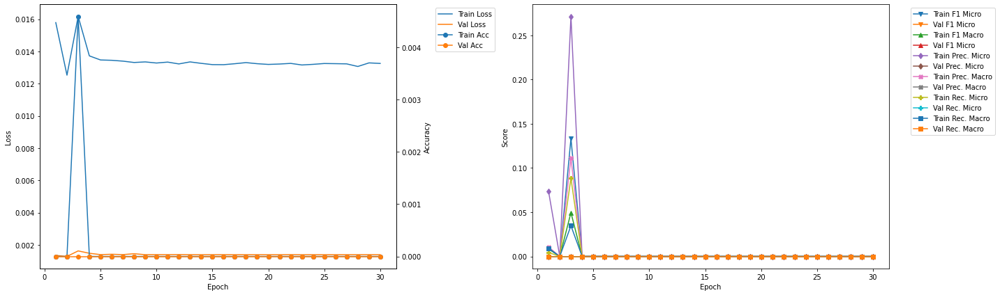

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.43
Train Loss: 0.0195 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1326 	Validation F1 Micro: 0.0
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1896 	Validation Precision Micro: 0.0
Train Precision Marco: 0.111 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.102 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0625 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.73
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

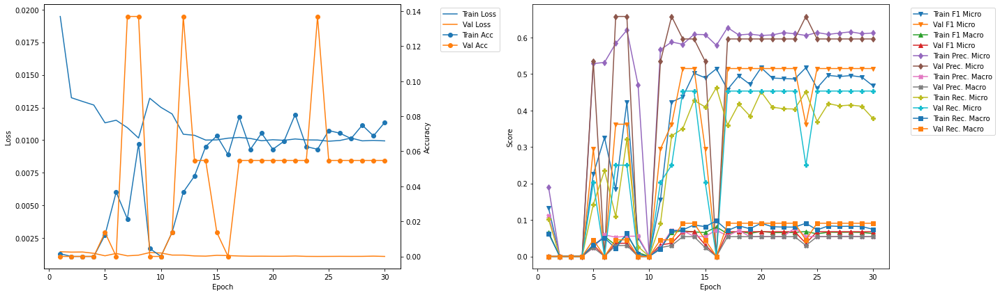

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.514793 --> 0.530259).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.59
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0489 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3571 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.5644 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0758 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.2612 	Validation Recall Micro: 0.4577
Train Recall Marco: 0.0603 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.89
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4704 	Validation F1 Micro: 0.5303
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0701
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6301
Train Preci

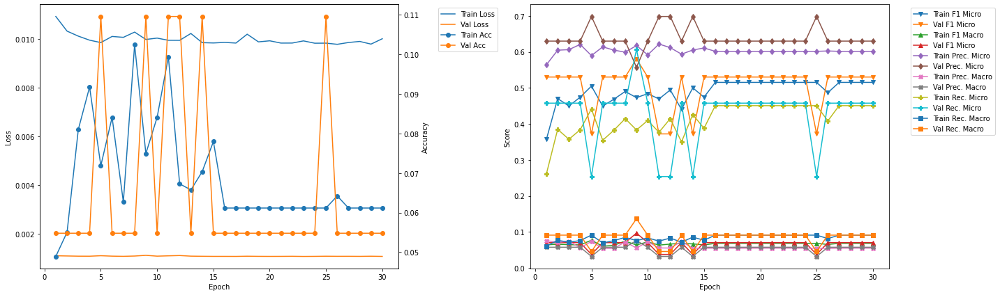

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.72
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4892 	Validation F1 Micro: 0.2667
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.6187 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.4045 	Validation Recall Micro: 0.1868
Train Recall Marco: 0.0798 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.02
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.4695
Train F1 Marco: 0.0699 	Validation F1 Macro: 0.0626
Train Precision Mirco: 0.6159 	Validation Precision Micro: 0.5274
Train Precision Marco: 0.0725 	Validation Precision Macro: 0.0479
Train Recall Mirco: 0.4215

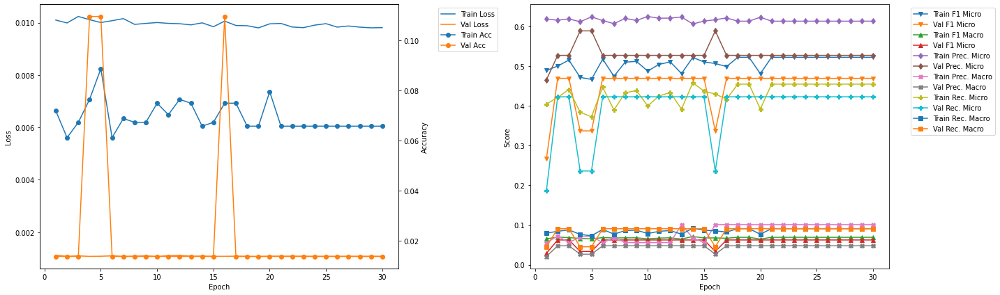

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.84
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4845 	Validation F1 Micro: 0.4795
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0651
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0746 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4026 	Validation Recall Micro: 0.4184
Train Recall Marco: 0.0807 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.14
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4947 	Validation F1 Micro: 0.4795
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0651
Train Precision Mirco: 0.6132 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4146 	

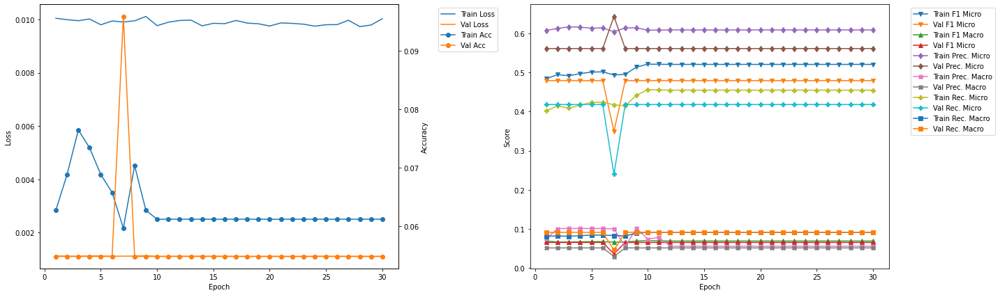

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.98
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4688 	Validation F1 Micro: 0.5393
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0721
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0738 	Validation Precision Macro: 0.0598
Train Recall Mirco: 0.3805 	Validation Recall Micro: 0.4571
Train Recall Marco: 0.0759 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.28
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4704 	Validation F1 Micro: 0.5594
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0946
Train Precision Mirco: 0.5958 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0679 	Validation Precision Macro: 0.0747
Train Recall Mirco: 0.3886

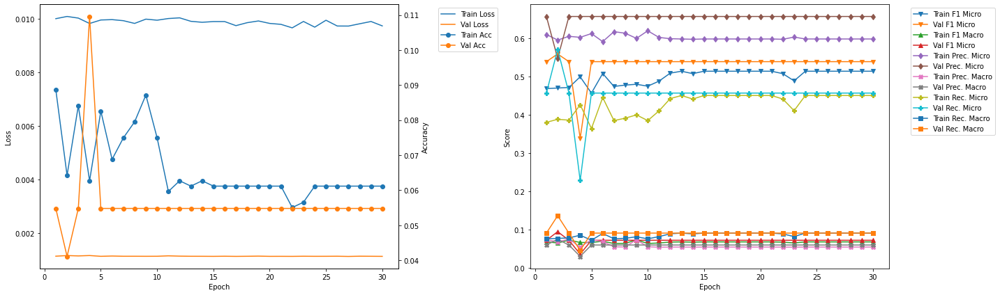

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.09
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4838 	Validation F1 Micro: 0.4754
Train F1 Marco: 0.0742 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0745 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4022 	Validation Recall Micro: 0.4121
Train Recall Marco: 0.0815 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.4
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5052 	Validation F1 Micro: 0.4754
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6107 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4308

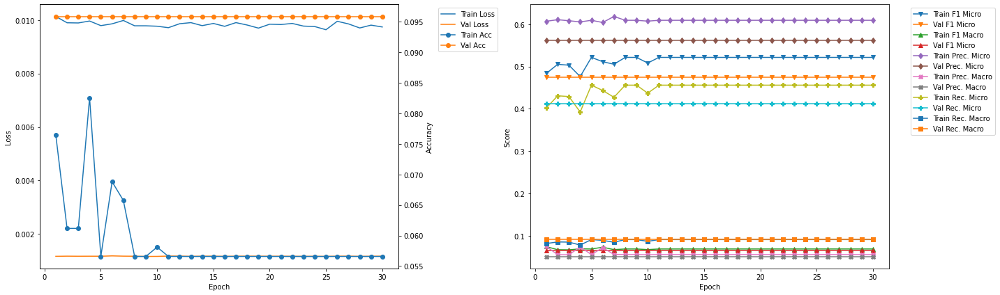

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 64.21
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0885 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4687 	Validation F1 Micro: 0.3922
Train F1 Marco: 0.0762 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.5922 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0739 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.3878 	Validation Recall Micro: 0.2732
Train Recall Marco: 0.0815 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 64.52
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4762 	Validation F1 Micro: 0.3922
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.5941 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0672 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.39

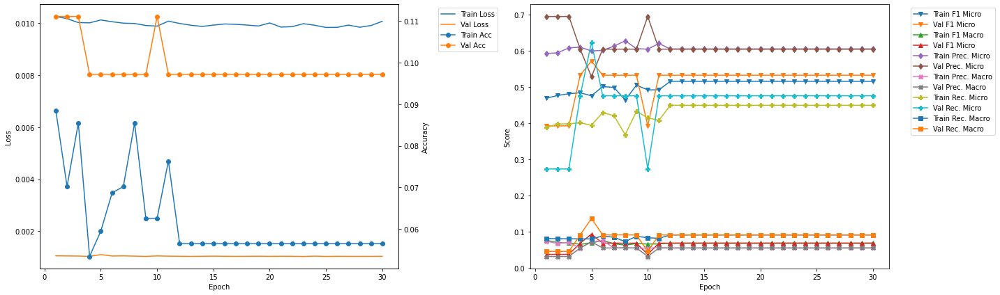

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 73.33
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0962 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4904 	Validation F1 Micro: 0.5423
Train F1 Marco: 0.0739 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0761 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4079 	Validation Recall Micro: 0.4673
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 73.63
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5104 	Validation F1 Micro: 0.369
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.4428 

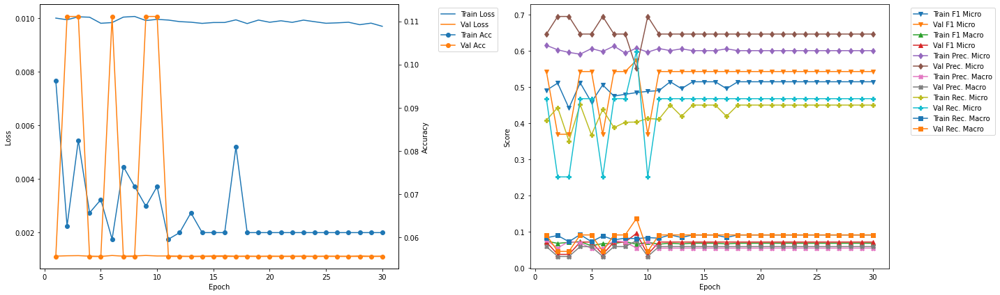

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 82.45
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0687 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4888 	Validation F1 Micro: 0.365
Train F1 Marco: 0.0753 	Validation F1 Macro: 0.0373
Train Precision Mirco: 0.5983 	Validation Precision Micro: 0.6944
Train Precision Marco: 0.0794 	Validation Precision Macro: 0.0316
Train Recall Mirco: 0.4132 	Validation Recall Micro: 0.2475
Train Recall Marco: 0.0851 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 82.76
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4914 	Validation F1 Micro: 0.5318
Train F1 Marco: 0.0759 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0751 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.416 	Va

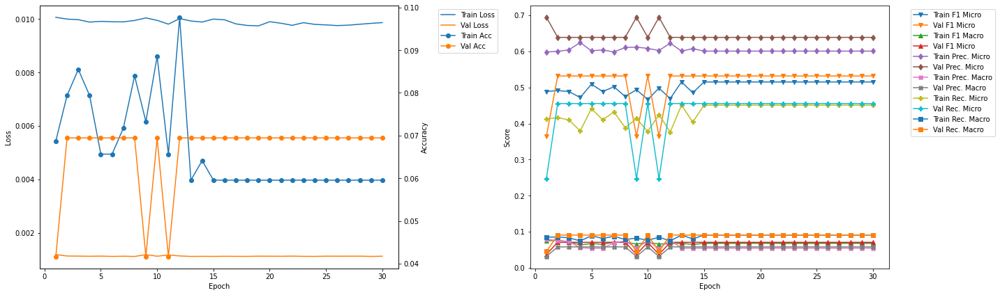

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 9
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.473 	Validation F1 Micro: 0.581
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0966
Train Precision Mirco: 0.6177 	Validation Precision Micro: 0.5571
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.076
Train Recall Mirco: 0.3832 	Validation Recall Micro: 0.607
Train Recall Marco: 0.0757 	Validation Recall Macro: 0.1364


In [26]:
resnet101LSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = resnet101LSTM_700_1_0, DistilBert = DB_resnet101, 
                                                 training_data = training_data, learning_rate = 0.01,
                                                 k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0172 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0365 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0339 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0769 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0862 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.024 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0366 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.6
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

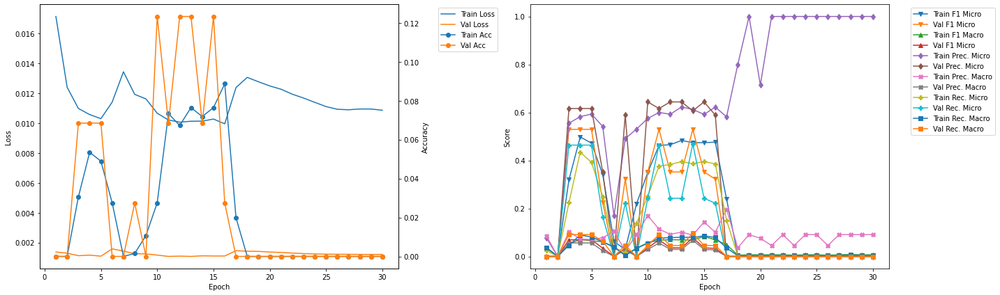

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.21
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0168 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0076 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4839 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0503 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0085 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0041 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.51
Train Loss: 0.0118 	Validation Loss: 0.0012
Train Accuracy: 0.0092 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1472 	Validation F1 Micro: 0.0207
Train F1 Marco: 0.0312 	Validation F1 Macro: 0.0051
Train Precision Mirco: 0.5581 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0782 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0848 	Validation Recall Micr

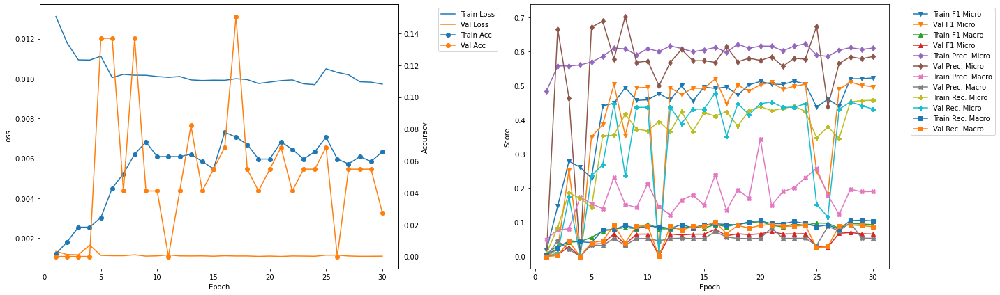

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.11
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4927 	Validation F1 Micro: 0.0208
Train F1 Marco: 0.1017 	Validation F1 Macro: 0.0152
Train Precision Mirco: 0.5936 	Validation Precision Micro: 0.2857
Train Precision Marco: 0.1839 	Validation Precision Macro: 0.0152
Train Recall Mirco: 0.4211 	Validation Recall Micro: 0.0108
Train Recall Marco: 0.1006 	Validation Recall Macro: 0.0152

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.4
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.506 	Validation F1 Micro: 0.4848
Train F1 Marco: 0.0955 	Validation F1 Macro: 0.0826
Train Precision Mirco: 0.6203 	Validation Precision Micro: 0.5517
Train Precision Marco: 0.1738 	Validation Precision Macro: 0.0739
Train Recall Mirco: 0.4274 	V

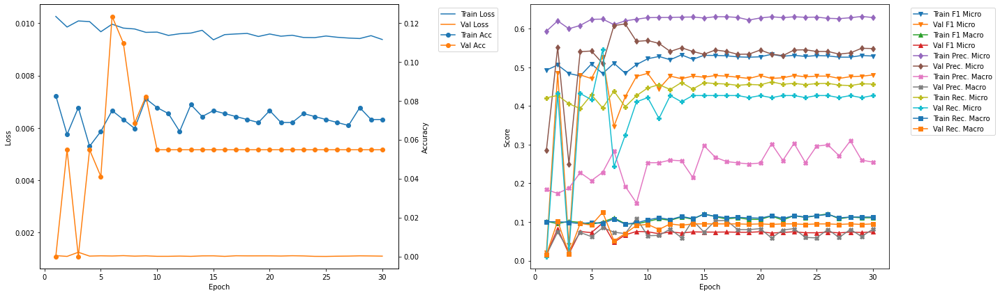

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.0
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0688 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4818 	Validation F1 Micro: 0.0461
Train F1 Marco: 0.0955 	Validation F1 Macro: 0.0323
Train Precision Mirco: 0.5948 	Validation Precision Micro: 0.8333
Train Precision Marco: 0.1884 	Validation Precision Macro: 0.0758
Train Recall Mirco: 0.405 	Validation Recall Micro: 0.0237
Train Recall Marco: 0.0934 	Validation Recall Macro: 0.0206

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.3
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4627 	Validation F1 Micro: 0.4754
Train F1 Marco: 0.0927 	Validation F1 Macro: 0.092
Train Precision Mirco: 0.6131 	Validation Precision Micro: 0.5613
Train Precision Marco: 0.1888 	Validation Precision Macro: 0.0983
Train Recall Mirco: 0.3715 	

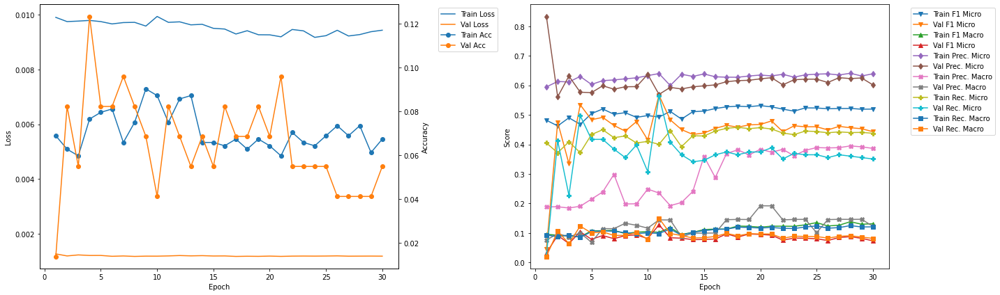

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4899 	Validation F1 Micro: 0.5627
Train F1 Marco: 0.1122 	Validation F1 Macro: 0.1502
Train Precision Mirco: 0.6215 	Validation Precision Micro: 0.6392
Train Precision Marco: 0.2379 	Validation Precision Macro: 0.213
Train Recall Mirco: 0.4044 	Validation Recall Micro: 0.5025
Train Recall Marco: 0.1056 	Validation Recall Macro: 0.1469

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.22
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5096 	Validation F1 Micro: 0.5584
Train F1 Marco: 0.1072 	Validation F1 Macro: 0.1138
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.6533
Train Precision Marco: 0.1959 	Validation Precision Macro: 0.1835
Train Recall Mirco: 0.441

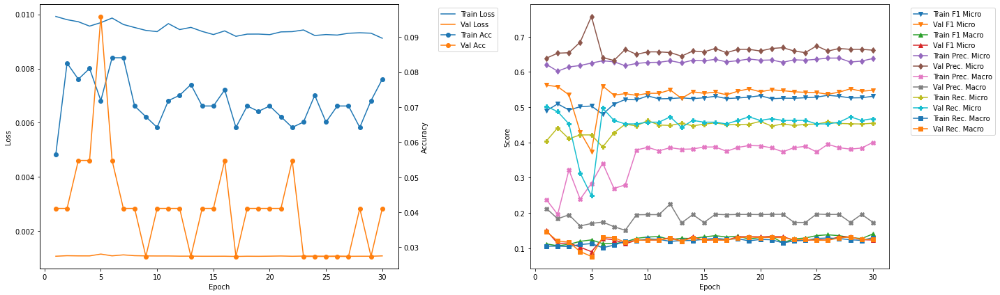

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.82
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4874 	Validation F1 Micro: 0.5627
Train F1 Marco: 0.1202 	Validation F1 Macro: 0.1468
Train Precision Mirco: 0.6207 	Validation Precision Micro: 0.6779
Train Precision Marco: 0.2849 	Validation Precision Macro: 0.2245
Train Recall Mirco: 0.4013 	Validation Recall Micro: 0.481
Train Recall Marco: 0.1074 	Validation Recall Macro: 0.139

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.11
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0917 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4852 	Validation F1 Micro: 0.5212
Train F1 Marco: 0.1247 	Validation F1 Macro: 0.1322
Train Precision Mirco: 0.6233 	Validation Precision Micro: 0.7167
Train Precision Marco: 0.2359 	Validation Precision Macro: 0.2461
Train Recall Mirco: 0.3972

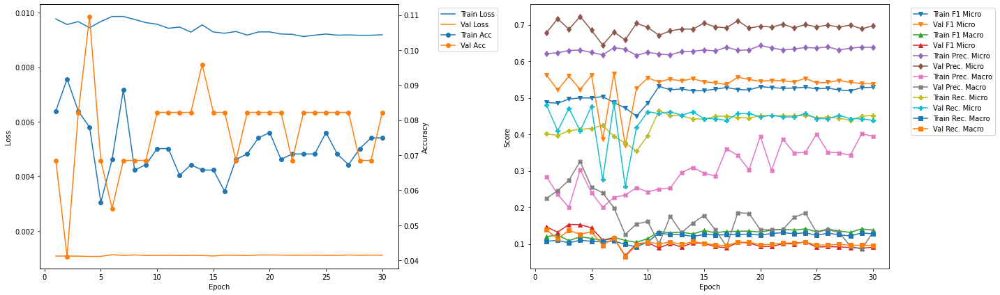

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 53.72
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5068 	Validation F1 Micro: 0.4681
Train F1 Marco: 0.1275 	Validation F1 Macro: 0.1298
Train Precision Mirco: 0.6315 	Validation Precision Micro: 0.5704
Train Precision Marco: 0.3256 	Validation Precision Macro: 0.2625
Train Recall Mirco: 0.4233 	Validation Recall Micro: 0.3969
Train Recall Marco: 0.1158 	Validation Recall Macro: 0.1221

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.01
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5281 	Validation F1 Micro: 0.4602
Train F1 Marco: 0.124 	Validation F1 Macro: 0.1337
Train Precision Mirco: 0.6277 	Validation Precision Micro: 0.5379
Train Precision Marco: 0.2877 	Validation Precision Macro: 0.2023
Train Recall Mirco: 0.455

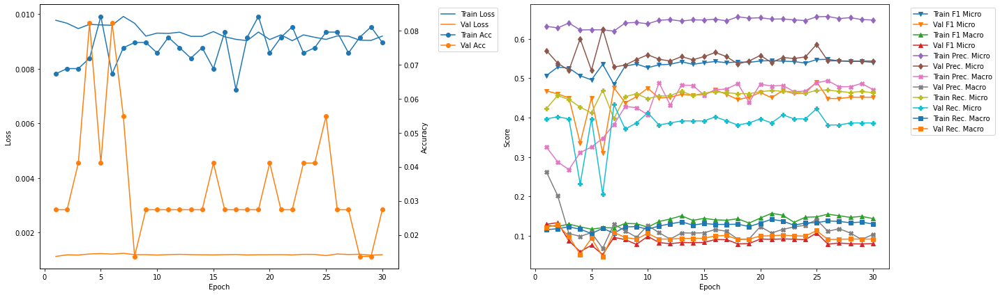

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 62.62
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.4832 	Validation F1 Micro: 0.5663
Train F1 Marco: 0.1291 	Validation F1 Macro: 0.1085
Train Precision Mirco: 0.6012 	Validation Precision Micro: 0.6573
Train Precision Marco: 0.4174 	Validation Precision Macro: 0.1711
Train Recall Mirco: 0.4039 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.1134 	Validation Recall Macro: 0.1104

Epoch 2 	Learning Rate: 0.01 	Time (min): 62.92
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0901 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.5159
Train F1 Marco: 0.121 	Validation F1 Macro: 0.1088
Train Precision Mirco: 0.6438 	Validation Precision Micro: 0.648
Train Precision Marco: 0.4014 	Validation Precision Macro: 0.1347
Train Recall Mirco: 0.3732 	

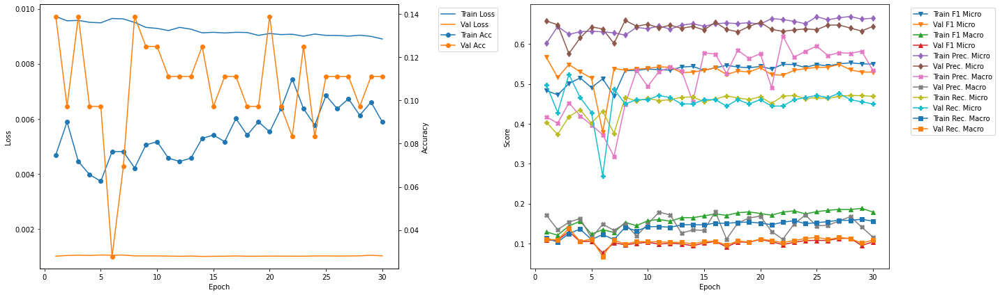

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 71.52
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.1806
Train F1 Mirco: 0.4988 	Validation F1 Micro: 0.543
Train F1 Marco: 0.1467 	Validation F1 Macro: 0.2013
Train Precision Mirco: 0.6288 	Validation Precision Micro: 0.6777
Train Precision Marco: 0.429 	Validation Precision Macro: 0.2633
Train Recall Mirco: 0.4134 	Validation Recall Micro: 0.453
Train Recall Marco: 0.1265 	Validation Recall Macro: 0.1874

Epoch 2 	Learning Rate: 0.01 	Time (min): 71.81
Train Loss: 0.0093 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.529 	Validation F1 Micro: 0.5583
Train F1 Marco: 0.1496 	Validation F1 Macro: 0.1753
Train Precision Mirco: 0.6483 	Validation Precision Micro: 0.6276
Train Precision Marco: 0.4664 	Validation Precision Macro: 0.2104
Train Recall Mirco: 0.4468 	Va

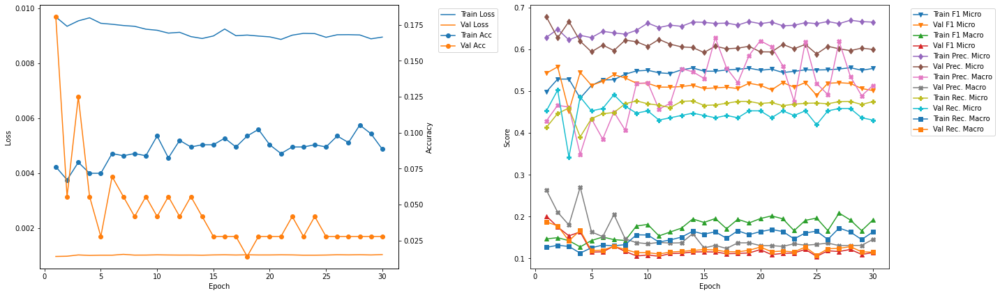

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 80.42
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.087 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4895 	Validation F1 Micro: 0.5399
Train F1 Marco: 0.1418 	Validation F1 Macro: 0.1245
Train Precision Mirco: 0.6391 	Validation Precision Micro: 0.6567
Train Precision Marco: 0.4489 	Validation Precision Macro: 0.1998
Train Recall Mirco: 0.3966 	Validation Recall Micro: 0.4583
Train Recall Marco: 0.1198 	Validation Recall Macro: 0.1211

Epoch 2 	Learning Rate: 0.01 	Time (min): 80.71
Train Loss: 0.0094 	Validation Loss: 0.001
Train Accuracy: 0.0962 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5399 	Validation F1 Micro: 0.4916
Train F1 Marco: 0.1606 	Validation F1 Macro: 0.153
Train Precision Mirco: 0.6372 	Validation Precision Micro: 0.6952
Train Precision Marco: 0.4224 	Validation Precision Macro: 0.2456
Train Recall Mirco: 0.4684 

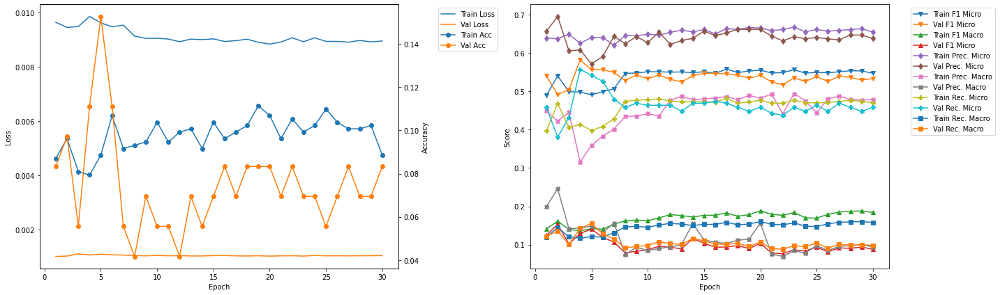

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 4
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4979 	Validation F1 Micro: 0.5815
Train F1 Marco: 0.1355 	Validation F1 Macro: 0.1293
Train Precision Mirco: 0.6253 	Validation Precision Micro: 0.608
Train Precision Marco: 0.3156 	Validation Precision Macro: 0.143
Train Recall Mirco: 0.4137 	Validation Recall Micro: 0.5573
Train Recall Marco: 0.1169 	Validation Recall Macro: 0.1425


In [27]:
densenet121LSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = densenet121LSTM_700_1_0, DistilBert = DB_densenet121, 
                                                   training_data = training_data, learning_rate = 0.01, 
                                                   k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0165 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0614 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0518 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1345 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1343 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0397 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0577 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.66
Train Loss: 0.0124 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

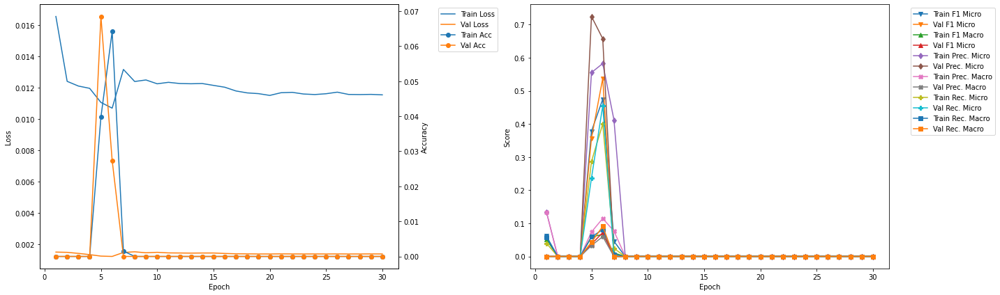

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.16
Train Loss: 0.013 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0448 	Validation F1 Micro: 0.0427
Train F1 Marco: 0.0178 	Validation F1 Macro: 0.011
Train Precision Mirco: 0.2544 	Validation Precision Micro: 0.1316
Train Precision Marco: 0.0782 	Validation Precision Macro: 0.1136
Train Recall Mirco: 0.0246 	Validation Recall Micro: 0.0255
Train Recall Marco: 0.018 	Validation Recall Macro: 0.0058

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.48
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.002 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.087 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 

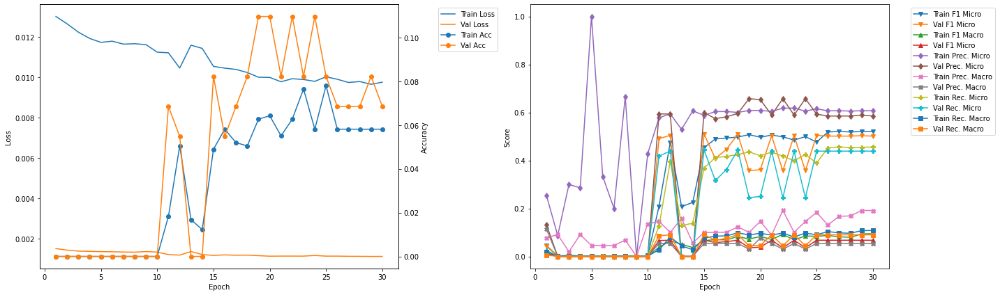

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.97
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4654 	Validation F1 Micro: 0.5292
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0796
Train Precision Mirco: 0.6152 	Validation Precision Micro: 0.585
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0984
Train Recall Mirco: 0.3742 	Validation Recall Micro: 0.4831
Train Recall Marco: 0.0757 	Validation Recall Macro: 0.0985

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.29
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.5169
Train F1 Marco: 0.0705 	Validation F1 Macro: 0.0661
Train Precision Mirco: 0.6135 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.1236 	Validation Precision Macro: 0.0526
Train Recall Mirco: 0.42 	Val

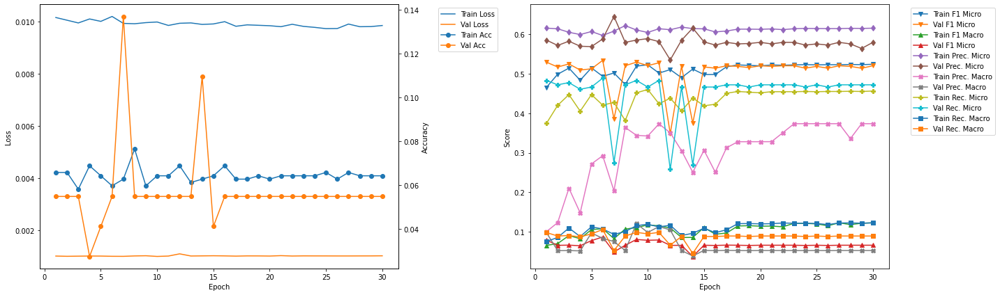

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.79
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0596 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4948 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.1187 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.5997 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.3435 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4211 	Validation Recall Micro: 0.4265
Train Recall Marco: 0.1101 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.11
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5064 	Validation F1 Micro: 0.4971
Train F1 Marco: 0.092 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.3675 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4303 	

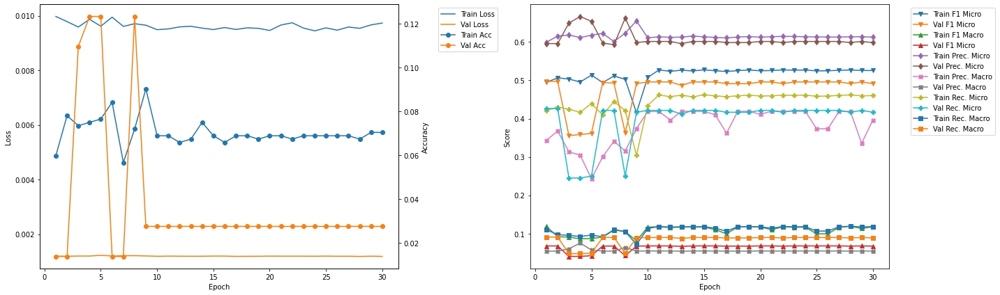

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.59
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5205 	Validation F1 Micro: 0.4661
Train F1 Marco: 0.1053 	Validation F1 Macro: 0.0928
Train Precision Mirco: 0.6111 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.3458 	Validation Precision Macro: 0.1846
Train Recall Mirco: 0.4532 	Validation Recall Micro: 0.4093
Train Recall Marco: 0.1091 	Validation Recall Macro: 0.1067

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.92
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.3521
Train F1 Marco: 0.1063 	Validation F1 Macro: 0.0602
Train Precision Mirco: 0.617 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.3589 	Validation Precision Macro: 0.1645
Train Recall Mirco: 0.4464

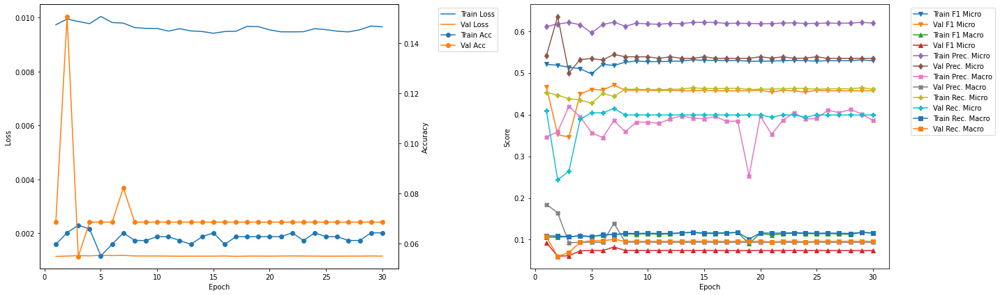

-------------------------------------------
FOLD 6
-------------------------------------------
Validation F1 Micro Score Increased (0.537815 --> 0.557103).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 49.42
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4801 	Validation F1 Micro: 0.5571
Train F1 Marco: 0.0807 	Validation F1 Macro: 0.1578
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.2079 	Validation Precision Macro: 0.221
Train Recall Mirco: 0.3953 	Validation Recall Micro: 0.4785
Train Recall Marco: 0.0855 	Validation Recall Macro: 0.1582

Epoch 2 	Learning Rate: 0.01 	Time (min): 49.75
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4981 	Validation F1 Micro: 0.3763
Train F1 Marco: 0.0871 	Validation F1 Macro: 0.082
Train Precision Mirco: 0.6143 	Validation Precision Micro: 0.6923
Train Precis

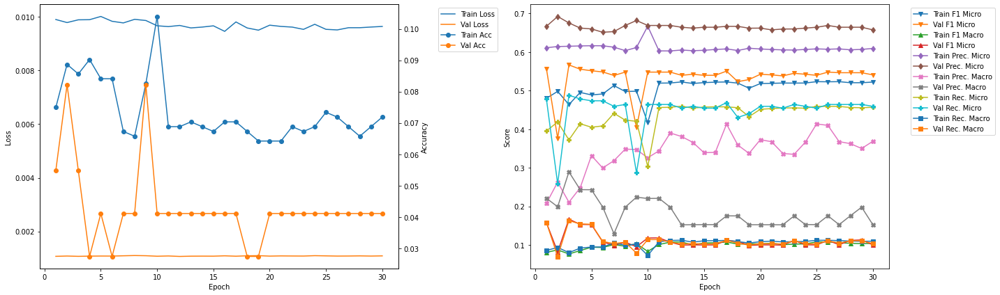

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.25
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4868 	Validation F1 Micro: 0.491
Train F1 Marco: 0.0949 	Validation F1 Macro: 0.1055
Train Precision Mirco: 0.6283 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.355 	Validation Precision Macro: 0.1421
Train Recall Mirco: 0.3973 	Validation Recall Micro: 0.4316
Train Recall Marco: 0.0924 	Validation Recall Macro: 0.1181

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.58
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5054 	Validation F1 Micro: 0.3446
Train F1 Marco: 0.1022 	Validation F1 Macro: 0.047
Train Precision Mirco: 0.623 	Validation Precision Micro: 0.5974
Train Precision Marco: 0.332 	Validation Precision Macro: 0.0827
Train Recall Mirco: 0.4252 	Va

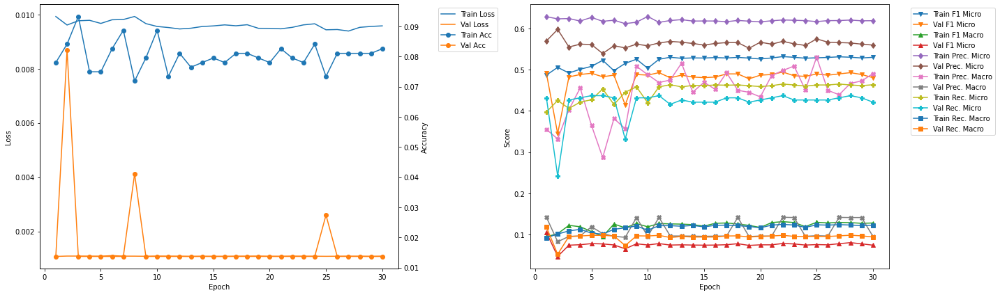

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.07
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0794 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4885 	Validation F1 Micro: 0.5217
Train F1 Marco: 0.1335 	Validation F1 Macro: 0.1449
Train Precision Mirco: 0.6147 	Validation Precision Micro: 0.5954
Train Precision Marco: 0.4506 	Validation Precision Macro: 0.2576
Train Recall Mirco: 0.4053 	Validation Recall Micro: 0.4643
Train Recall Marco: 0.1164 	Validation Recall Macro: 0.1458

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.39
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5005 	Validation F1 Micro: 0.5143
Train F1 Marco: 0.1075 	Validation F1 Macro: 0.1054
Train Precision Mirco: 0.6206 	Validation Precision Micro: 0.551
Train Precision Marco: 0.3485 	Validation Precision Macro: 0.1866
Train Recall Mirco: 0.4193 	Va

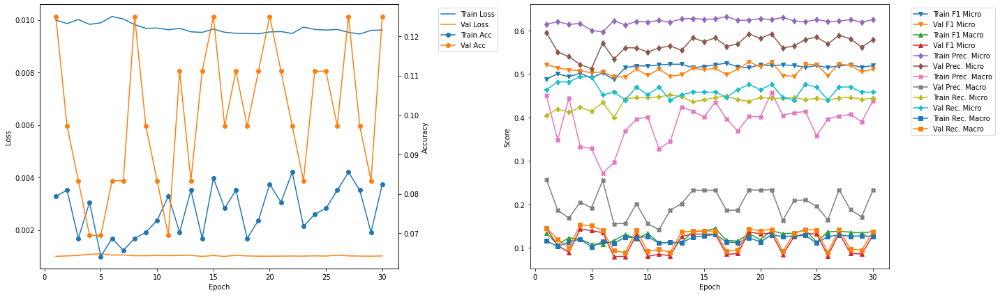

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 78.88
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4857 	Validation F1 Micro: 0.5228
Train F1 Marco: 0.1188 	Validation F1 Macro: 0.1056
Train Precision Mirco: 0.6058 	Validation Precision Micro: 0.6825
Train Precision Marco: 0.3379 	Validation Precision Macro: 0.1993
Train Recall Mirco: 0.4054 	Validation Recall Micro: 0.4236
Train Recall Marco: 0.1127 	Validation Recall Macro: 0.1001

Epoch 2 	Learning Rate: 0.01 	Time (min): 79.21
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0947 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4754 	Validation F1 Micro: 0.5584
Train F1 Marco: 0.1308 	Validation F1 Macro: 0.0911
Train Precision Mirco: 0.6205 	Validation Precision Micro: 0.6622
Train Precision Marco: 0.3903 	Validation Precision Macro: 0.15
Train Recall Mirco: 0.3853

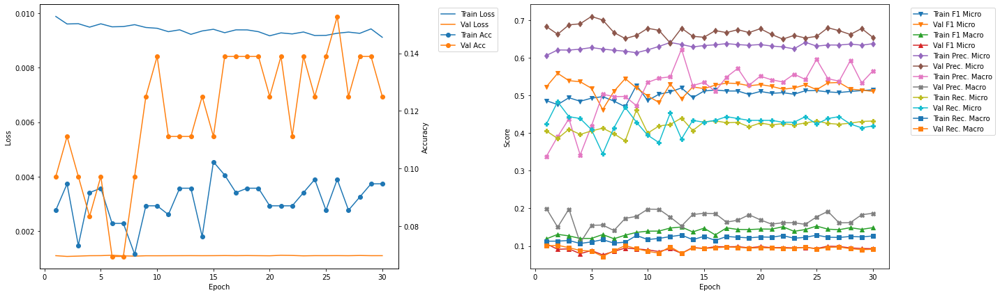

-------------------------------------------
FOLD 10
-------------------------------------------
Validation F1 Micro Score Increased (0.566667 --> 0.567251).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 88.71
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0931 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.4909 	Validation F1 Micro: 0.5673
Train F1 Marco: 0.1356 	Validation F1 Macro: 0.1036
Train Precision Mirco: 0.6308 	Validation Precision Micro: 0.6599
Train Precision Marco: 0.4818 	Validation Precision Macro: 0.1657
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.1156 	Validation Recall Macro: 0.1076

Validation F1 Micro Score Increased (0.567251 --> 0.581006).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 89.05
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4979 	Validation F1 Micro: 0.581
Train F1 Marco: 0.1211 	Validation F1 Macro: 0.11

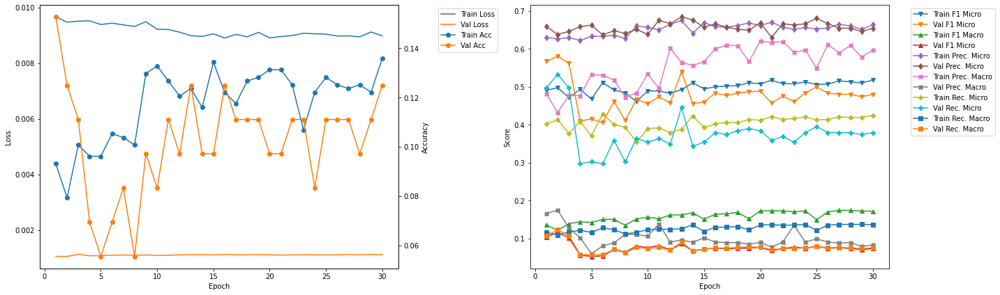

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 2
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0794 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4979 	Validation F1 Micro: 0.581
Train F1 Marco: 0.1211 	Validation F1 Macro: 0.1161
Train Precision Mirco: 0.6263 	Validation Precision Micro: 0.638
Train Precision Marco: 0.4325 	Validation Precision Macro: 0.1747
Train Recall Mirco: 0.4132 	Validation Recall Micro: 0.5333
Train Recall Marco: 0.109 	Validation Recall Macro: 0.1225


In [28]:
densenet169LSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = densenet169LSTM_700_1_0, DistilBert = DB_densenet169, 
                                                   training_data = training_data, learning_rate = 0.01, k_folds = 10, 
                                                   n_epochs = 30, model_name = 'densenet169LSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0171 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0649 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0426 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1426 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1306 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.042 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0305 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.69
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

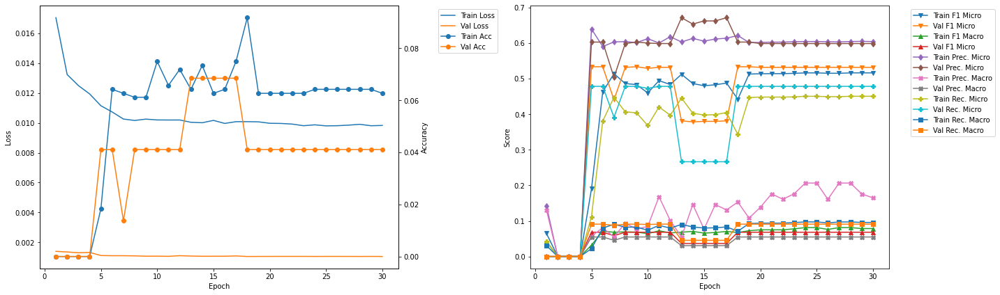

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.76
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4927 	Validation F1 Micro: 0.4956
Train F1 Marco: 0.0709 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.1307 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4162 	Validation Recall Micro: 0.4352
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.1
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.4956
Train F1 Marco: 0.0772 	Validation F1 Macro: 0.0664
Train Precision Mirco: 0.613 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.1601 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4316

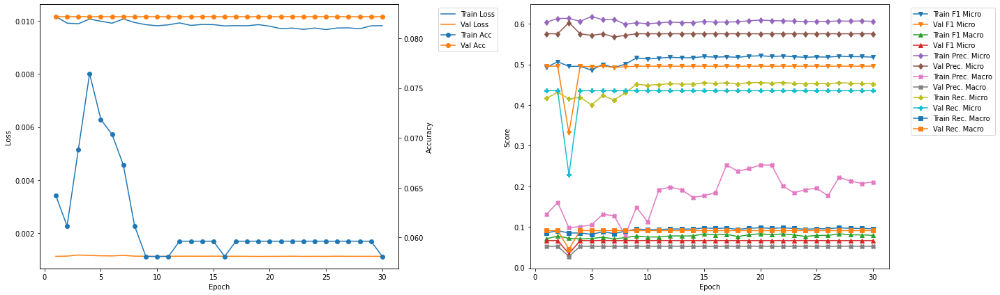

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.17
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4891 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0792 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.5878
Train Precision Marco: 0.1447 	Validation Precision Macro: 0.1005
Train Recall Mirco: 0.4128 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.087 	Validation Recall Macro: 0.0892

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.51
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.445 	Validation F1 Micro: 0.4784
Train F1 Marco: 0.0746 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.5996 	Validation Precision Micro: 0.5764
Train Precision Marco: 0.1842 	Validation Precision Macro: 0.0551
Train Recall Mirco: 0.3538 	Va

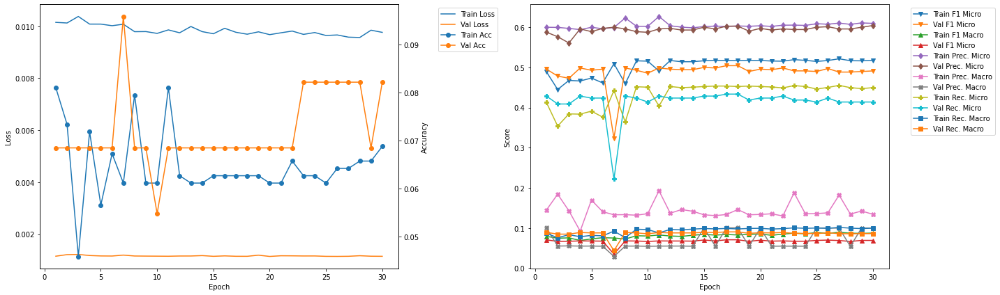

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.58
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.4985
Train F1 Marco: 0.0804 	Validation F1 Macro: 0.0827
Train Precision Mirco: 0.6044 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.165 	Validation Precision Macro: 0.0982
Train Recall Mirco: 0.4244 	Validation Recall Micro: 0.4439
Train Recall Marco: 0.0914 	Validation Recall Macro: 0.0958

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.93
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4818 	Validation F1 Micro: 0.5119
Train F1 Marco: 0.0727 	Validation F1 Macro: 0.0868
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.5772
Train Precision Marco: 0.1236 	Validation Precision Macro: 0.0895
Train Recall Mirco: 0.398

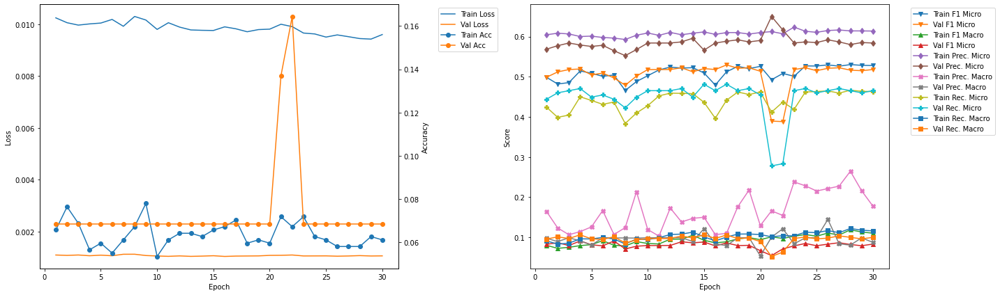

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.0
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5201 	Validation F1 Micro: 0.5157
Train F1 Marco: 0.0882 	Validation F1 Macro: 0.101
Train Precision Mirco: 0.6081 	Validation Precision Micro: 0.5578
Train Precision Marco: 0.1719 	Validation Precision Macro: 0.1252
Train Recall Mirco: 0.4544 	Validation Recall Micro: 0.4795
Train Recall Marco: 0.1026 	Validation Recall Macro: 0.1153

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.34
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.508 	Validation F1 Micro: 0.4397
Train F1 Marco: 0.097 	Validation F1 Macro: 0.0947
Train Precision Mirco: 0.6067 	Validation Precision Micro: 0.5586
Train Precision Marco: 0.1717 	Validation Precision Macro: 0.1295
Train Recall Mirco: 0.4369 	Vali

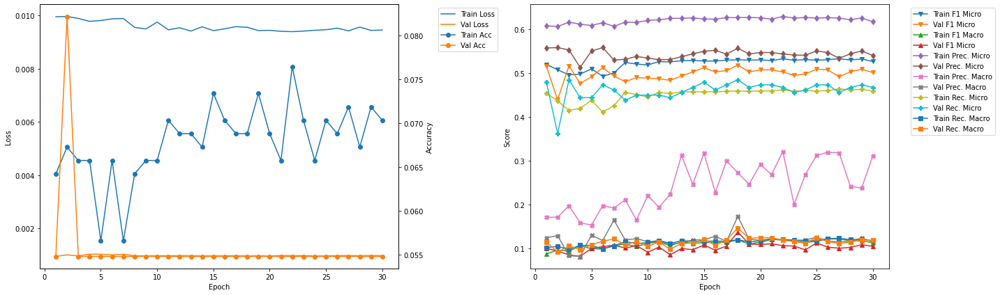

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 52.41
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5224 	Validation F1 Micro: 0.4151
Train F1 Marco: 0.1109 	Validation F1 Macro: 0.0731
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6286
Train Precision Marco: 0.2022 	Validation Precision Macro: 0.1455
Train Recall Mirco: 0.4602 	Validation Recall Micro: 0.3099
Train Recall Marco: 0.1178 	Validation Recall Macro: 0.0719

Epoch 2 	Learning Rate: 0.01 	Time (min): 52.76
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0795 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4814 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.103 	Validation F1 Macro: 0.0912
Train Precision Mirco: 0.6173 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.2005 	Validation Precision Macro: 0.1326
Train Recall Mirco: 0.394

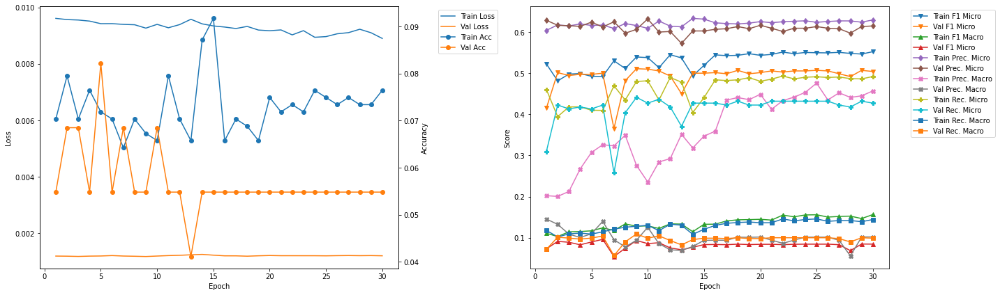

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 62.82
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0917 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.5028
Train F1 Marco: 0.1387 	Validation F1 Macro: 0.0847
Train Precision Mirco: 0.6238 	Validation Precision Micro: 0.5806
Train Precision Marco: 0.381 	Validation Precision Macro: 0.1142
Train Recall Mirco: 0.426 	Validation Recall Micro: 0.4433
Train Recall Marco: 0.1228 	Validation Recall Macro: 0.1014

Epoch 2 	Learning Rate: 0.01 	Time (min): 63.17
Train Loss: 0.0094 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.534 	Validation F1 Micro: 0.4905
Train F1 Marco: 0.1715 	Validation F1 Macro: 0.0938
Train Precision Mirco: 0.6179 	Validation Precision Micro: 0.5488
Train Precision Marco: 0.4419 	Validation Precision Macro: 0.1139
Train Recall Mirco: 0.4702 

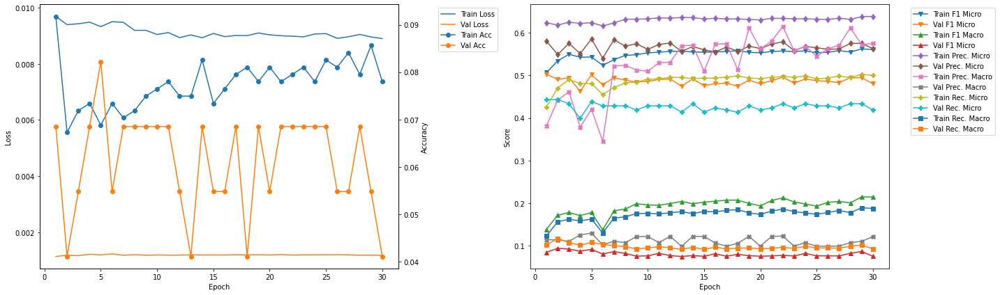

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.533333 --> 0.604396).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 73.26
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5117 	Validation F1 Micro: 0.6044
Train F1 Marco: 0.1663 	Validation F1 Macro: 0.153
Train Precision Mirco: 0.6256 	Validation Precision Micro: 0.6627
Train Precision Marco: 0.5517 	Validation Precision Macro: 0.1706
Train Recall Mirco: 0.4328 	Validation Recall Micro: 0.5556
Train Recall Marco: 0.1446 	Validation Recall Macro: 0.1703

Epoch 2 	Learning Rate: 0.01 	Time (min): 73.61
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5277 	Validation F1 Micro: 0.5892
Train F1 Marco: 0.1681 	Validation F1 Macro: 0.1276
Train Precision Mirco: 0.6235 	Validation Precision Micro: 0.671
Train Precisio

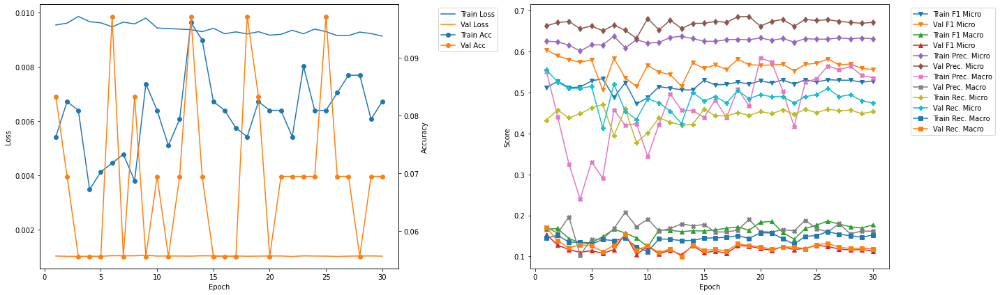

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 83.67
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5158 	Validation F1 Micro: 0.5387
Train F1 Marco: 0.1605 	Validation F1 Macro: 0.1192
Train Precision Mirco: 0.6151 	Validation Precision Micro: 0.6395
Train Precision Marco: 0.4537 	Validation Precision Macro: 0.1992
Train Recall Mirco: 0.4441 	Validation Recall Micro: 0.4653
Train Recall Marco: 0.1425 	Validation Recall Macro: 0.1224

Epoch 2 	Learning Rate: 0.01 	Time (min): 84.01
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0794 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4866 	Validation F1 Micro: 0.547
Train F1 Marco: 0.1205 	Validation F1 Macro: 0.1128
Train Precision Mirco: 0.6184 	Validation Precision Micro: 0.6443
Train Precision Marco: 0.2816 	Validation Precision Macro: 0.1148
Train Recall Mirco: 0.4011 

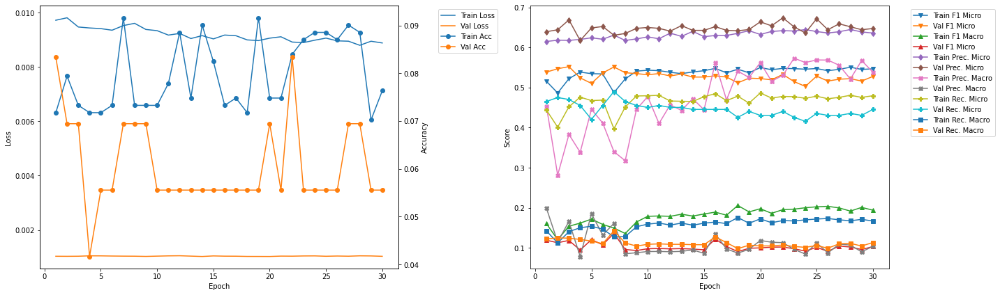

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 94.08
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.087 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5102 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.1257 	Validation F1 Macro: 0.1469
Train Precision Mirco: 0.6298 	Validation Precision Micro: 0.5946
Train Precision Marco: 0.3331 	Validation Precision Macro: 0.1911
Train Recall Mirco: 0.4287 	Validation Recall Micro: 0.456
Train Recall Marco: 0.1181 	Validation Recall Macro: 0.1461

Epoch 2 	Learning Rate: 0.01 	Time (min): 94.42
Train Loss: 0.0095 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5367 	Validation F1 Micro: 0.4893
Train F1 Marco: 0.1293 	Validation F1 Macro: 0.1466
Train Precision Mirco: 0.617 	Validation Precision Micro: 0.597
Train Precision Marco: 0.2738 	Validation Precision Macro: 0.1827
Train Recall Mirco: 0.4749 

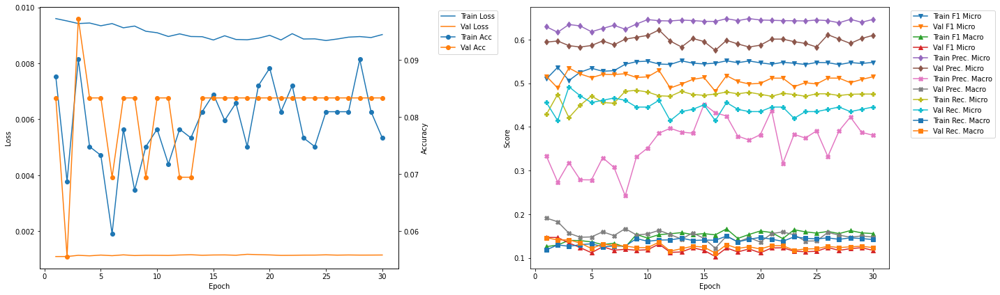

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 1
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5117 	Validation F1 Micro: 0.6044
Train F1 Marco: 0.1663 	Validation F1 Macro: 0.153
Train Precision Mirco: 0.6256 	Validation Precision Micro: 0.6627
Train Precision Marco: 0.5517 	Validation Precision Macro: 0.1706
Train Recall Mirco: 0.4328 	Validation Recall Micro: 0.5556
Train Recall Marco: 0.1446 	Validation Recall Macro: 0.1703


In [29]:
densenet201LSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = densenet201LSTM_700_1_0, DistilBert = DB_densenet201, 
                                                   training_data = training_data, learning_rate = 0.01, 
                                                   k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.37
Train Loss: 0.0177 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0842 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0605 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1157 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1267 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0661 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0591 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.74
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

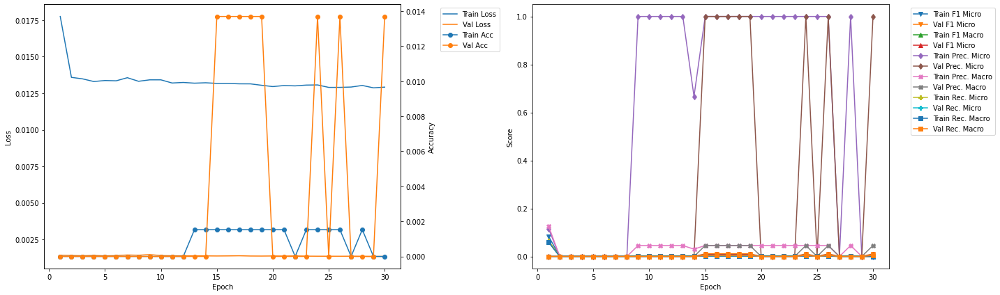

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.39
Train Loss: 0.0155 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0577 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0443 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1347 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1164 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0367 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0342 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.75
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 

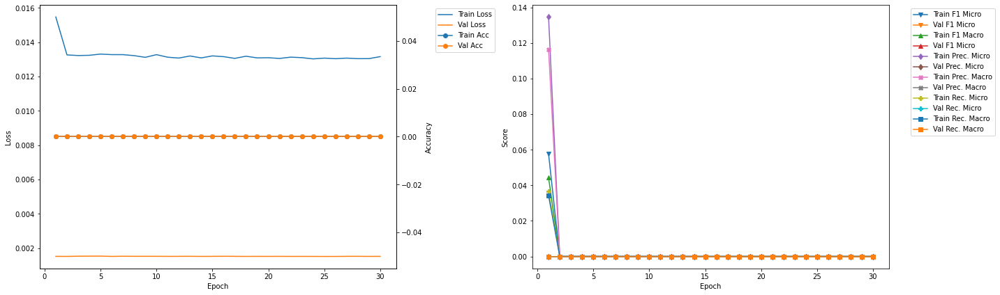

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.39
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.76
Train Loss: 0.0132 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

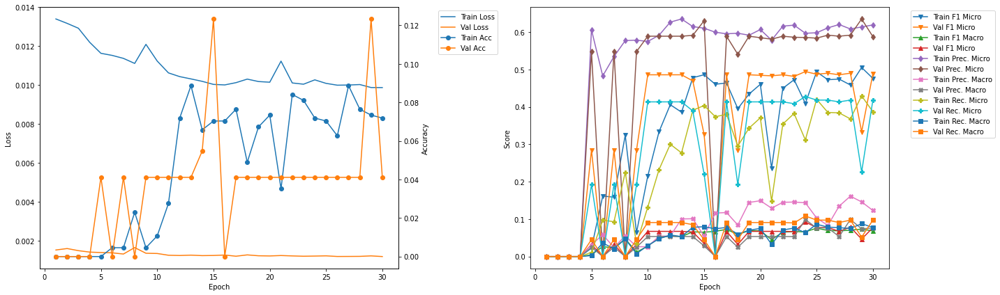

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.47
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4532 	Validation F1 Micro: 0.4852
Train F1 Marco: 0.0809 	Validation F1 Macro: 0.0879
Train Precision Mirco: 0.5989 	Validation Precision Micro: 0.5395
Train Precision Marco: 0.1297 	Validation Precision Macro: 0.1044
Train Recall Mirco: 0.3646 	Validation Recall Micro: 0.4409
Train Recall Marco: 0.0804 	Validation Recall Macro: 0.1064

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.83
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.4865
Train F1 Marco: 0.0726 	Validation F1 Macro: 0.0892
Train Precision Mirco: 0.6156 	Validation Precision Micro: 0.551
Train Precision Marco: 0.0935 	Validation Precision Macro: 0.1404
Train Recall Mirco: 0.417

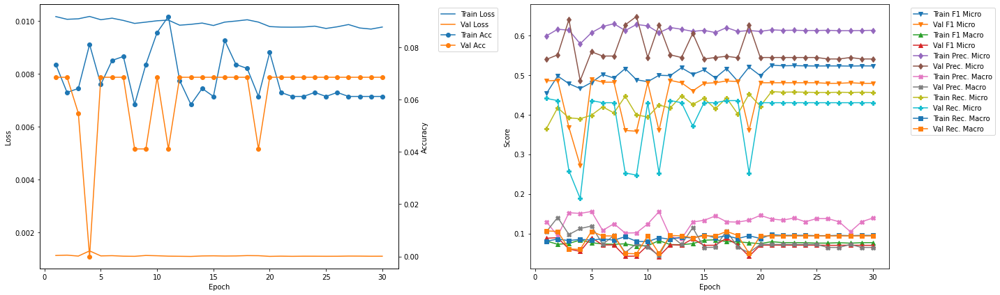

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.494444 --> 0.551929).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 44.49
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4843 	Validation F1 Micro: 0.5519
Train F1 Marco: 0.0811 	Validation F1 Macro: 0.09
Train Precision Mirco: 0.5962 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1446 	Validation Precision Macro: 0.1028
Train Recall Mirco: 0.4077 	Validation Recall Micro: 0.4869
Train Recall Marco: 0.088 	Validation Recall Macro: 0.1028

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.86
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4673 	Validation F1 Micro: 0.5503
Train F1 Marco: 0.0725 	Validation F1 Macro: 0.09
Train Precision Mirco: 0.6013 	Validation Precision Micro: 0.6327
Train Precision Ma

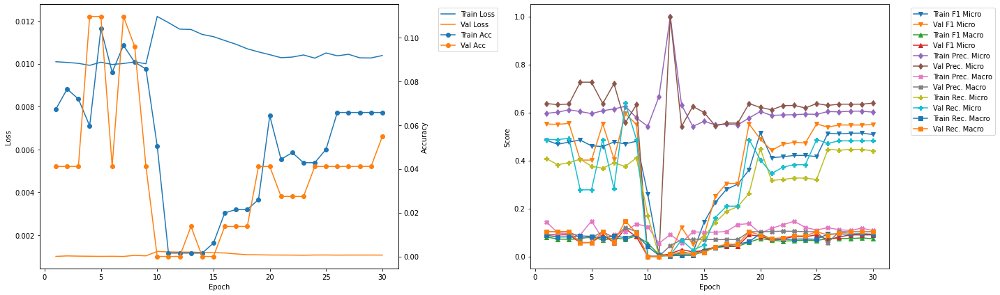

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.55
Train Loss: 0.0115 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2519 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0509 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4838 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1427 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1703 	Validation Recall Micro: 0.0
Train Recall Marco: 0.043 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.91
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.026 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.3432 	Validation F1 Micro: 0.5732
Train F1 Marco: 0.0595 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.5799 	Validation Precision Micro: 0.6861
Train Precision Marco: 0.1342 	Validation Precision Macro: 0.0619
Train Recall Mirco: 0.2437 	Validation Recall Mi

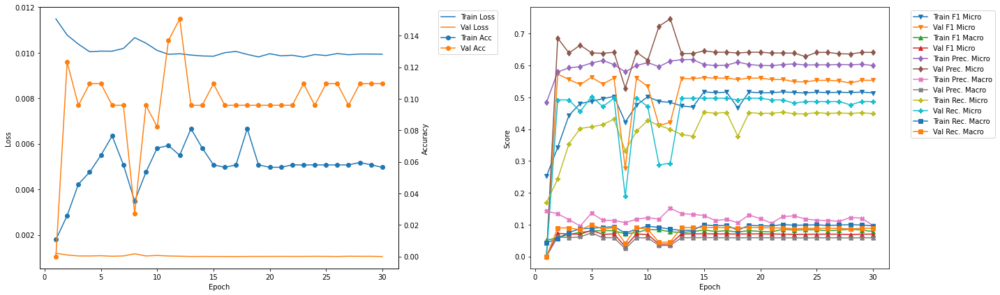

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 66.56
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0443 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4834 	Validation F1 Micro: 0.4055
Train F1 Marco: 0.0774 	Validation F1 Macro: 0.0585
Train Precision Mirco: 0.5893 	Validation Precision Micro: 0.7024
Train Precision Marco: 0.1315 	Validation Precision Macro: 0.0996
Train Recall Mirco: 0.4098 	Validation Recall Micro: 0.285
Train Recall Marco: 0.0877 	Validation Recall Macro: 0.0574

Epoch 2 	Learning Rate: 0.01 	Time (min): 66.92
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4803 	Validation F1 Micro: 0.5424
Train F1 Marco: 0.0811 	Validation F1 Macro: 0.0828
Train Precision Mirco: 0.578 	Validation Precision Micro: 0.6531
Train Precision Marco: 0.1526 	Validation Precision Macro: 0.1046
Train Recall Mirco: 0.4109 	

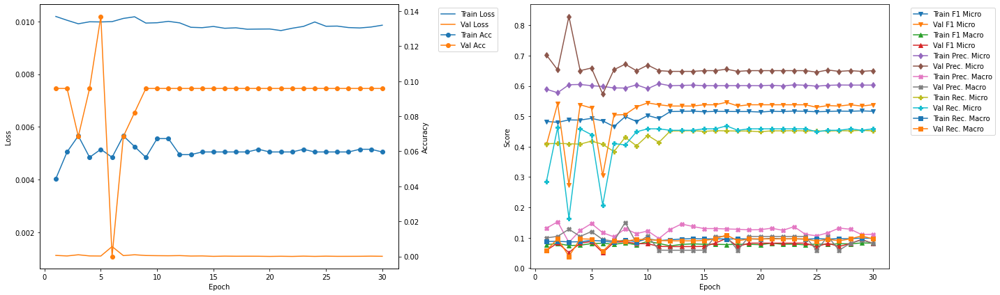

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 77.56
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4929 	Validation F1 Micro: 0.3547
Train F1 Marco: 0.0857 	Validation F1 Macro: 0.0468
Train Precision Mirco: 0.6007 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.1194 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.418 	Validation Recall Micro: 0.2461
Train Recall Marco: 0.092 	Validation Recall Macro: 0.053

Epoch 2 	Learning Rate: 0.01 	Time (min): 77.93
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0885 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4906 	Validation F1 Micro: 0.4926
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6156 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.1007 	Validation Precision Macro: 0.0524
Train Recall Mirco: 0.4077 

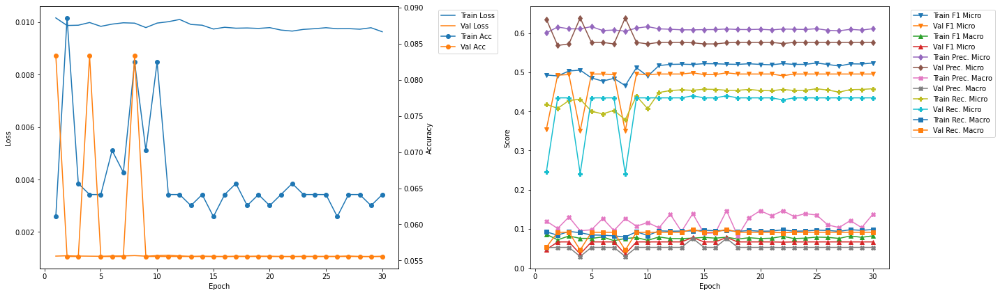

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 88.58
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4864 	Validation F1 Micro: 0.5356
Train F1 Marco: 0.076 	Validation F1 Macro: 0.1056
Train Precision Mirco: 0.6042 	Validation Precision Micro: 0.5142
Train Precision Marco: 0.132 	Validation Precision Macro: 0.1143
Train Recall Mirco: 0.407 	Validation Recall Micro: 0.559
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.1442

Epoch 2 	Learning Rate: 0.01 	Time (min): 88.94
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0718 	Validation Accuracy: 0.125
Train F1 Mirco: 0.5057 	Validation F1 Micro: 0.5163
Train F1 Marco: 0.0866 	Validation F1 Macro: 0.0772
Train Precision Mirco: 0.5913 	Validation Precision Micro: 0.6127
Train Precision Marco: 0.1491 	Validation Precision Macro: 0.1008
Train Recall Mirco: 0.4418 	Val

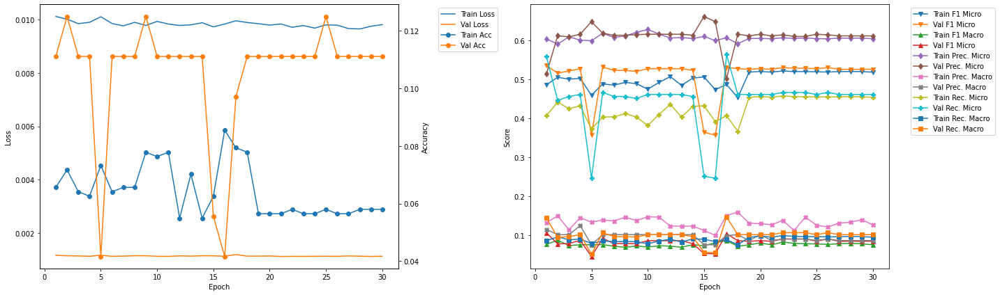

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 99.59
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0489 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4949 	Validation F1 Micro: 0.3309
Train F1 Marco: 0.0835 	Validation F1 Macro: 0.0475
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6
Train Precision Marco: 0.1404 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.4194 	Validation Recall Micro: 0.2284
Train Recall Marco: 0.091 	Validation Recall Macro: 0.0545

Epoch 2 	Learning Rate: 0.01 	Time (min): 99.95
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5003 	Validation F1 Micro: 0.5131
Train F1 Marco: 0.0757 	Validation F1 Macro: 0.0945
Train Precision Mirco: 0.609 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.1128 	Validation Precision Macro: 0.1452
Train Recall Mirco: 0.4246 	V

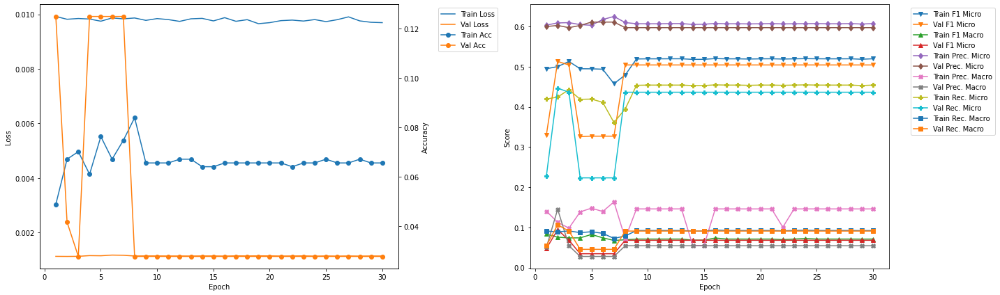

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 5 	Epoch: 8
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4692 	Validation F1 Micro: 0.5951
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.1157
Train Precision Mirco: 0.6258 	Validation Precision Micro: 0.5571
Train Precision Marco: 0.1045 	Validation Precision Macro: 0.1207
Train Recall Mirco: 0.3753 	Validation Recall Micro: 0.6387
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.1478


In [30]:
vgg11bnLSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = vgg11bnLSTM_700_1_0, DistilBert = DB_vgg11bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0286 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0923 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0597 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1297 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1175 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0716 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0605 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.77
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

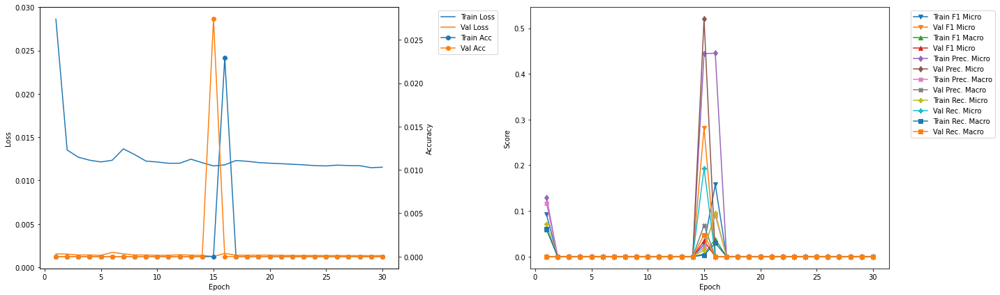

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.87
Train Loss: 0.0131 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0424 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0179 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2343 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0745 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0233 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0138 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.25
Train Loss: 0.0123 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 

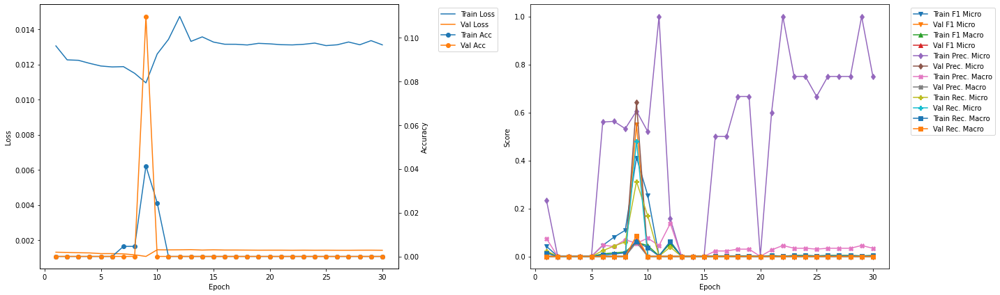

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.36
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.74
Train Loss: 0.0135 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

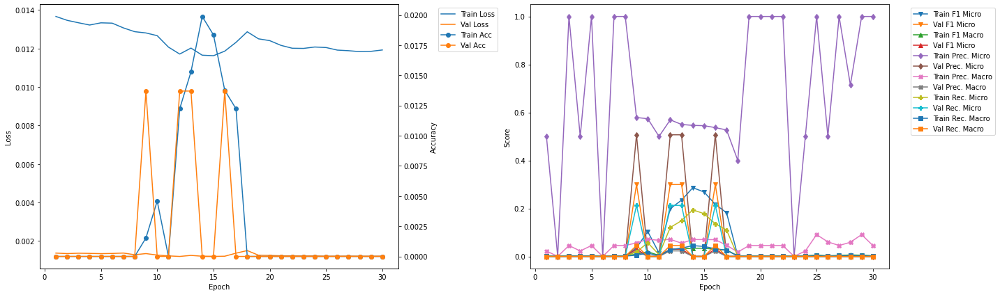

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.84
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0333 	Validation F1 Micro: 0.0
Train F1 Marco: 0.009 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5769 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0709 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0171 	Validation Recall Micro: 0.0
Train Recall Marco: 0.005 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.22
Train Loss: 0.0119 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

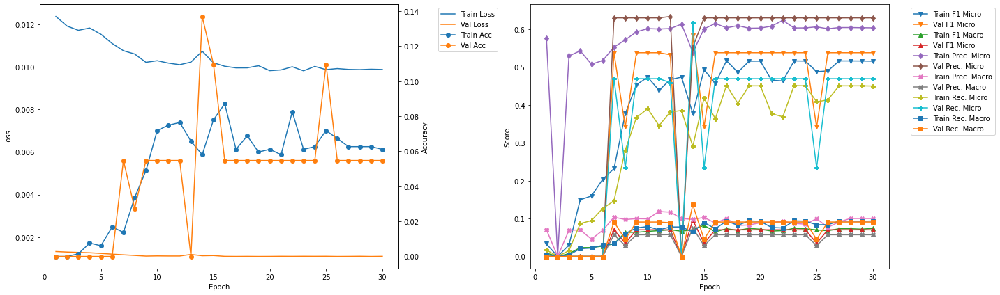

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.34
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4557 	Validation F1 Micro: 0.5134
Train F1 Marco: 0.0777 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6187
Train Precision Marco: 0.1072 	Validation Precision Macro: 0.0561
Train Recall Mirco: 0.3655 	Validation Recall Micro: 0.4388
Train Recall Marco: 0.0779 	Validation Recall Macro: 0.0898

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.72
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4762 	Validation F1 Micro: 0.3556
Train F1 Marco: 0.0792 	Validation F1 Macro: 0.0486
Train Precision Mirco: 0.5778 	Validation Precision Micro: 0.6486
Train Precision Marco: 0.1156 	Validation Precision Macro: 0.0747
Train Recall Mirco: 0.40

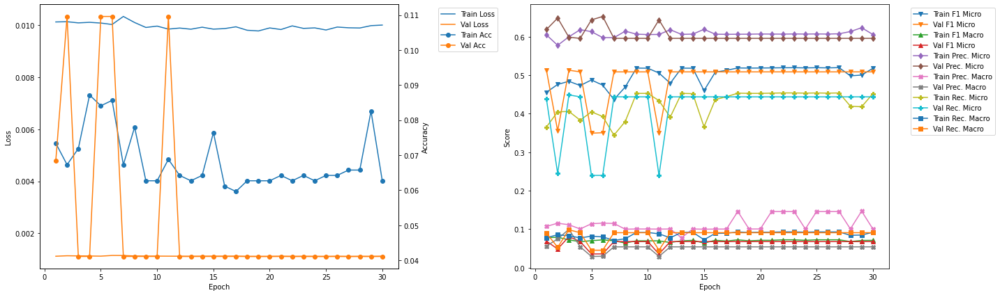

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 57.81
Train Loss: 0.0105 	Validation Loss: 0.0012
Train Accuracy: 0.0474 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4187 	Validation F1 Micro: 0.5128
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.5981 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.1627 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.322 	Validation Recall Micro: 0.439
Train Recall Marco: 0.0669 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 58.19
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4938 	Validation F1 Micro: 0.3381
Train F1 Marco: 0.0768 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.5963 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.1162 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4214 	V

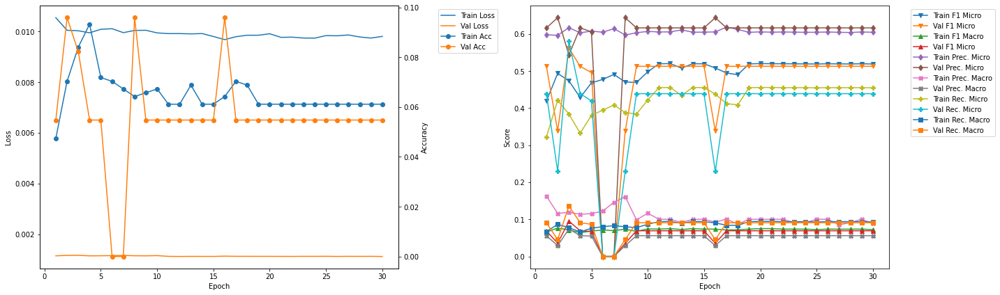

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.28
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4315 	Validation F1 Micro: 0.4723
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6183 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0882 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3314 	Validation Recall Micro: 0.4112
Train Recall Marco: 0.0686 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.66
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5087 	Validation F1 Micro: 0.3704
Train F1 Marco: 0.0781 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.6019 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.1069 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.4406

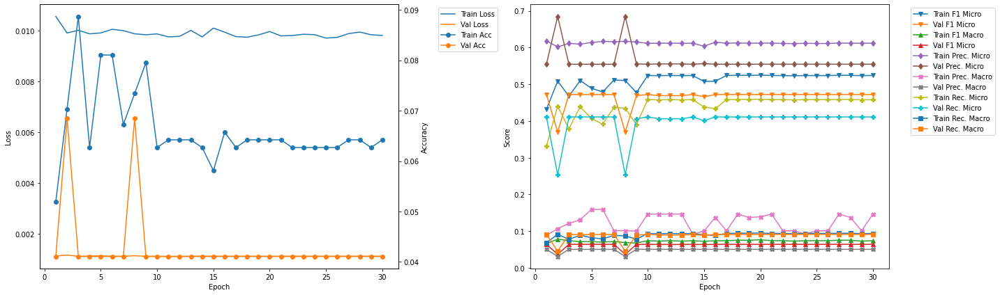

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 80.76
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4742 	Validation F1 Micro: 0.4925
Train F1 Marco: 0.0774 	Validation F1 Macro: 0.0735
Train Precision Mirco: 0.5875 	Validation Precision Micro: 0.5775
Train Precision Marco: 0.1611 	Validation Precision Macro: 0.0977
Train Recall Mirco: 0.3975 	Validation Recall Micro: 0.4293
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0923

Epoch 2 	Learning Rate: 0.01 	Time (min): 81.14
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4705 	Validation F1 Micro: 0.5075
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0753
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0997 	Validation Precision Macro: 0.0988
Train Recall Mirco: 0.3838

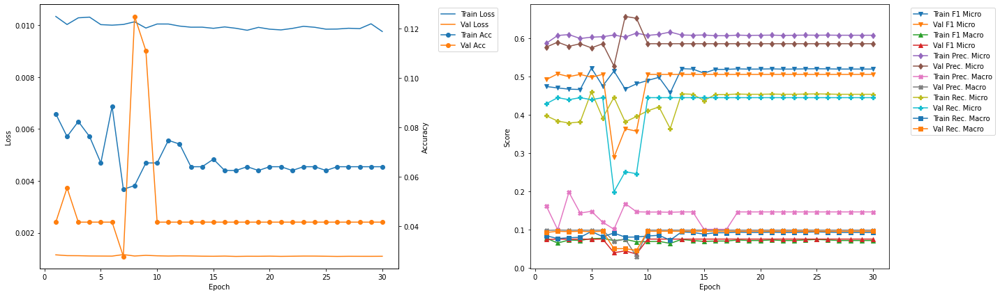

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 92.23
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4664 	Validation F1 Micro: 0.3778
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.0377
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.7083
Train Precision Marco: 0.1662 	Validation Precision Macro: 0.0322
Train Recall Mirco: 0.3774 	Validation Recall Micro: 0.2576
Train Recall Marco: 0.0774 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 92.61
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4958 	Validation F1 Micro: 0.3778
Train F1 Marco: 0.0777 	Validation F1 Macro: 0.0377
Train Precision Mirco: 0.5987 	Validation Precision Micro: 0.7083
Train Precision Marco: 0.1644 	Validation Precision Macro: 0.0322
Train Recall Mirco: 0.4231

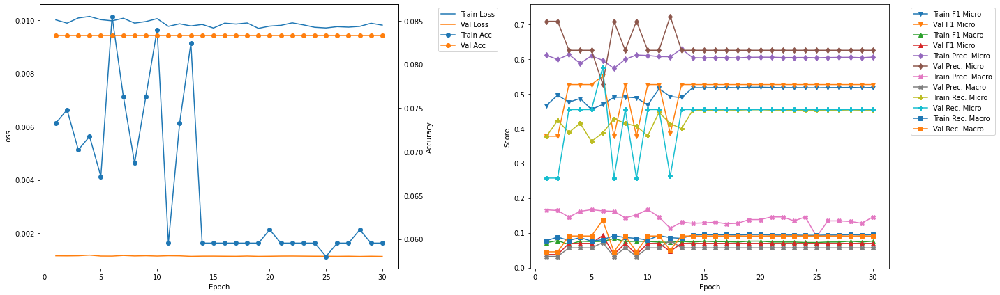

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 103.71
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0794 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4775 	Validation F1 Micro: 0.5217
Train F1 Marco: 0.0765 	Validation F1 Macro: 0.0803
Train Precision Mirco: 0.5978 	Validation Precision Micro: 0.625
Train Precision Marco: 0.1548 	Validation Precision Macro: 0.1021
Train Recall Mirco: 0.3975 	Validation Recall Micro: 0.4478
Train Recall Marco: 0.0839 	Validation Recall Macro: 0.0965

Epoch 2 	Learning Rate: 0.01 	Time (min): 104.09
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4847 	Validation F1 Micro: 0.5205
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0804
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.6312
Train Precision Marco: 0.1228 	Validation Precision Macro: 0.1025
Train Recall Mirco: 0.

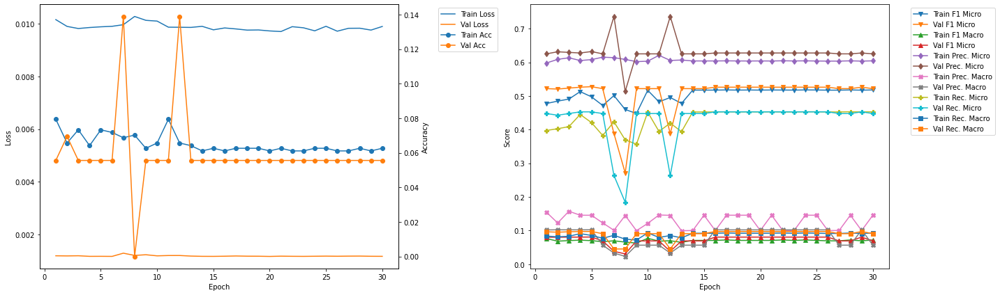

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 14
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.137
Train F1 Mirco: 0.3777 	Validation F1 Micro: 0.5831
Train F1 Marco: 0.0705 	Validation F1 Macro: 0.0961
Train Precision Mirco: 0.5392 	Validation Precision Micro: 0.5525
Train Precision Marco: 0.0977 	Validation Precision Macro: 0.0753
Train Recall Mirco: 0.2907 	Validation Recall Micro: 0.6173
Train Recall Marco: 0.0647 	Validation Recall Macro: 0.1364


In [31]:
vgg16bnLSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = vgg16bnLSTM_700_1_0, DistilBert = DB_vgg16bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_0_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.0178 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0477 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0345 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1106 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0586 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0304 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0343 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.79
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

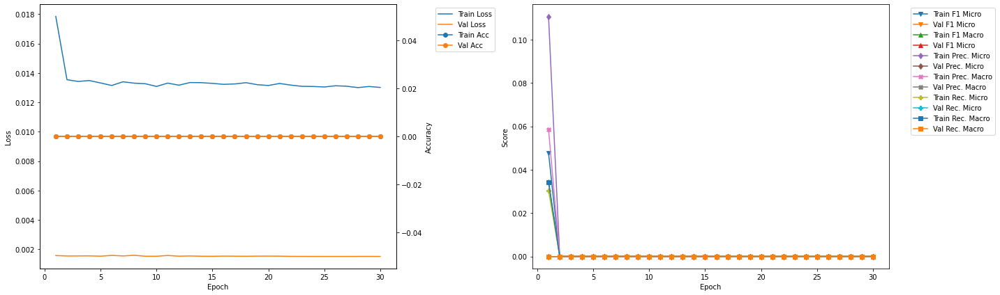

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.16
Train Loss: 0.0135 	Validation Loss: 0.0017
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.55
Train Loss: 0.0131 	Validation Loss: 0.0017
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

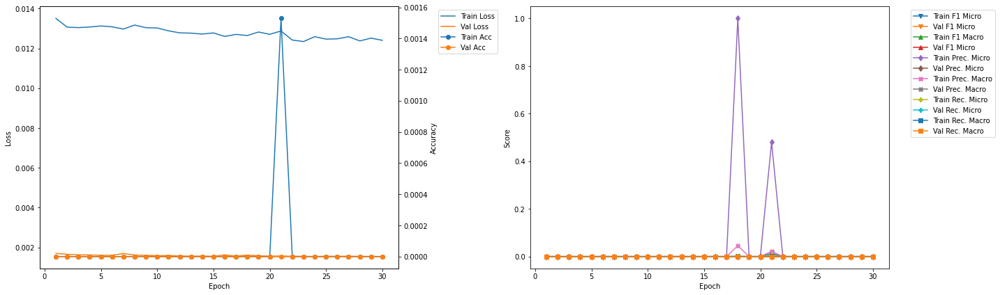

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.91
Train Loss: 0.013 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0286 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0058 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5098 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0232 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0147 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0033 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.31
Train Loss: 0.0128 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0242 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0061 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4314 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0645 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0124 	Validation Recall Micro: 0.0
Train R

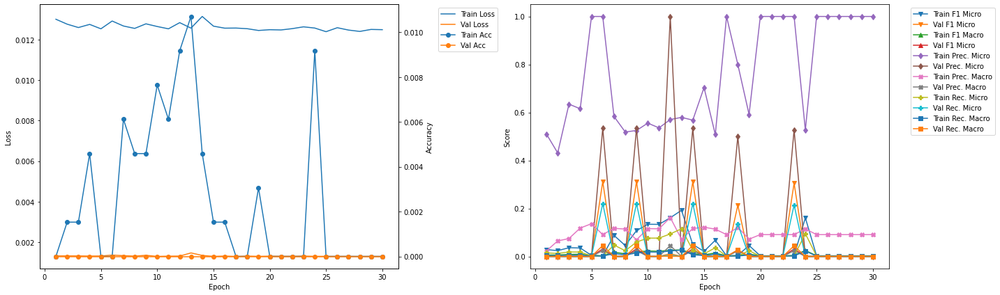

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.69
Train Loss: 0.0127 	Validation Loss: 0.0013
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1296 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0224 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5658 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1165 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0732 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0175 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.08
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0107 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1454 	Validation F1 Micro: 0.2879
Train F1 Marco: 0.0235 	Validation F1 Macro: 0.0306
Train Precision Mirco: 0.521 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.1144 	Validation Precision Macro: 0.023
Train Recall Mirco: 0.0845 	Validation Recall M

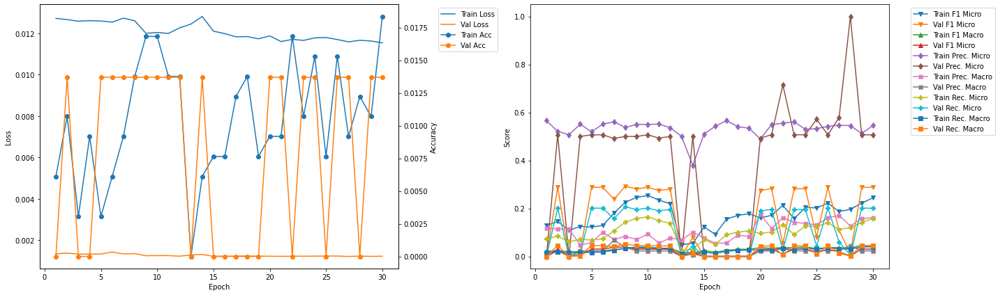

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.44
Train Loss: 0.0119 	Validation Loss: 0.0012
Train Accuracy: 0.0092 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.1843 	Validation F1 Micro: 0.2762
Train F1 Marco: 0.035 	Validation F1 Macro: 0.0286
Train Precision Mirco: 0.5223 	Validation Precision Micro: 0.4648
Train Precision Marco: 0.1297 	Validation Precision Macro: 0.0211
Train Recall Mirco: 0.1119 	Validation Recall Micro: 0.1964
Train Recall Marco: 0.0291 	Validation Recall Macro: 0.0441

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.84
Train Loss: 0.0117 	Validation Loss: 0.0012
Train Accuracy: 0.0168 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.2264 	Validation F1 Micro: 0.2822
Train F1 Marco: 0.0427 	Validation F1 Macro: 0.0289
Train Precision Mirco: 0.538 	Validation Precision Micro: 0.4658
Train Precision Marco: 0.1776 	Validation Precision Macro: 0.0212
Train Recall Mirco: 0.1433

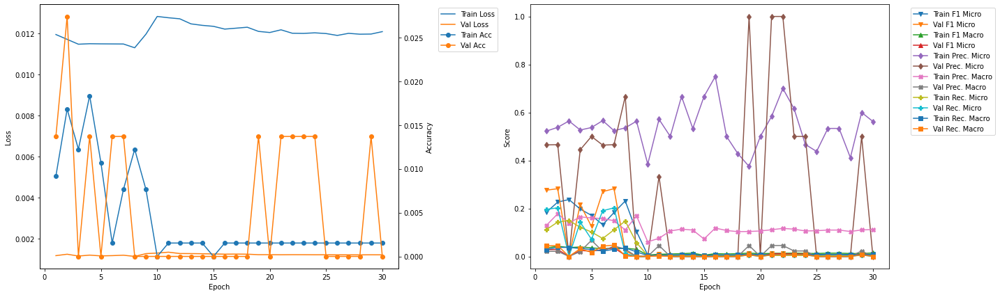

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.21
Train Loss: 0.0122 	Validation Loss: 0.0012
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0106
Train F1 Marco: 0.0095 	Validation F1 Macro: 0.0152
Train Precision Mirco: 0.5714 	Validation Precision Micro: 1.0
Train Precision Marco: 0.1023 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0023 	Validation Recall Micro: 0.0053
Train Recall Marco: 0.005 	Validation Recall Macro: 0.0091

Validation F1 Micro Score Increased (0.312000 --> 0.376923).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.62
Train Loss: 0.0109 	Validation Loss: 0.0011
Train Accuracy: 0.0214 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.1114 	Validation F1 Micro: 0.3769
Train F1 Marco: 0.0232 	Validation F1 Macro: 0.0512
Train Precision Mirco: 0.6646 	Validation Precision Micro: 0.6712
Train Precision M

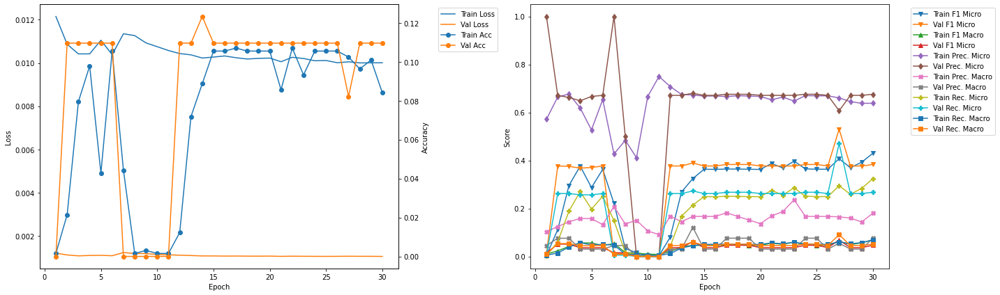

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 71.04
Train Loss: 0.0112 	Validation Loss: 0.0012
Train Accuracy: 0.0459 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.2748 	Validation F1 Micro: 0.3855
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.5038 	Validation Precision Micro: 0.7067
Train Precision Marco: 0.2319 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.1889 	Validation Recall Micro: 0.265
Train Recall Marco: 0.0515 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 71.43
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0963 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.3618 	Validation F1 Micro: 0.3824
Train F1 Marco: 0.0492 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.6576 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.1731 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.2496

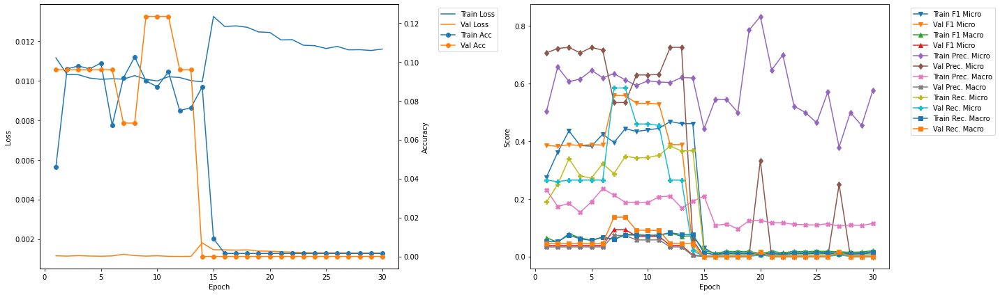

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 82.83
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.0262 	Validation F1 Micro: 0.0208
Train F1 Marco: 0.0163 	Validation F1 Macro: 0.0433
Train Precision Mirco: 0.3288 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.1388 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0137 	Validation Recall Micro: 0.0106
Train Recall Marco: 0.01 	Validation Recall Macro: 0.0303

Epoch 2 	Learning Rate: 0.01 	Time (min): 83.22
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.0057 	Validation F1 Micro: 0.0209
Train F1 Marco: 0.0061 	Validation F1 Macro: 0.0433
Train Precision Mirco: 1.0 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0028 	Validation

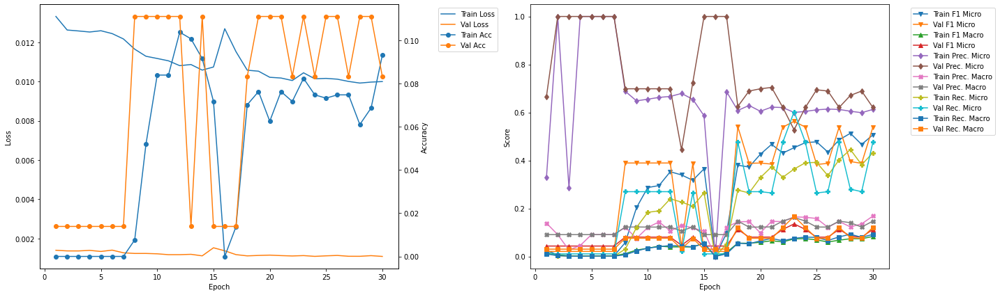

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 94.62
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0565 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.3764 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0906
Train Precision Mirco: 0.5892 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.1648 	Validation Precision Macro: 0.1489
Train Recall Mirco: 0.2766 	Validation Recall Micro: 0.4326
Train Recall Marco: 0.0594 	Validation Recall Macro: 0.1016

Epoch 2 	Learning Rate: 0.01 	Time (min): 95.01
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.087 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4893 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0725 	Validation F1 Macro: 0.0906
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.6414
Train Precision Marco: 0.1457 	Validation Precision Macro: 0.1489
Train Recall Mirco: 0.4082 

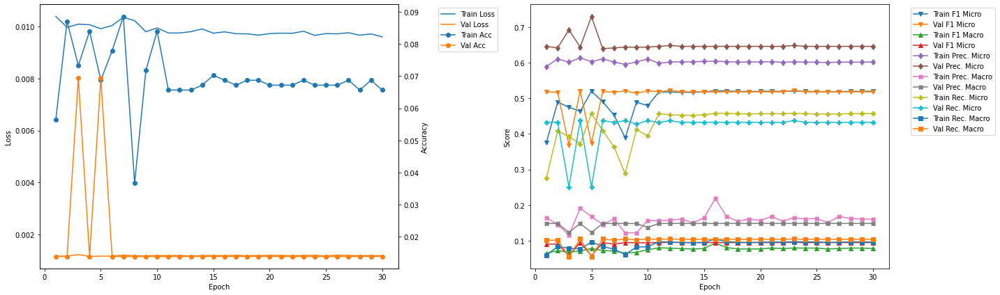

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 106.38
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.466 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0892 	Validation F1 Macro: 0.0815
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.7103
Train Precision Marco: 0.2379 	Validation Precision Macro: 0.0923
Train Recall Mirco: 0.38 	Validation Recall Micro: 0.3858
Train Recall Marco: 0.0886 	Validation Recall Macro: 0.0783

Validation F1 Micro Score Increased (0.562963 --> 0.587571).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 106.8
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4689 	Validation F1 Micro: 0.5876
Train F1 Marco: 0.0798 	Validation F1 Macro: 0.0981
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6624
Train Precisio

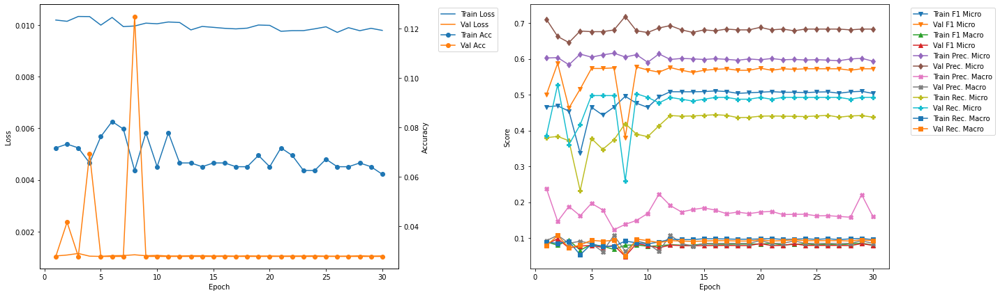

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 2
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4689 	Validation F1 Micro: 0.5876
Train F1 Marco: 0.0798 	Validation F1 Macro: 0.0981
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6624
Train Precision Marco: 0.1463 	Validation Precision Macro: 0.1076
Train Recall Mirco: 0.3834 	Validation Recall Micro: 0.5279
Train Recall Marco: 0.0851 	Validation Recall Macro: 0.1069


In [32]:
vgg19bnLSTM_700_1_0_best = Kfold_train_CNN_RNN_DB(CNN = vgg19bnLSTM_700_1_0, DistilBert = DB_vgg19bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_0_DB')

In [33]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 14:45:50


## Training Summary

### Summary Table

In [34]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_0_best,
    'ResNet50' : resnet50LSTM_700_1_0_best,
    'ResNet101' : resnet101LSTM_700_1_0_best,
    'DenseNet121' : densenet121LSTM_700_1_0_best,
    'DenseNet169' : densenet169LSTM_700_1_0_best,
    'DenseNet201' : densenet201LSTM_700_1_0_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_0_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_0_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_0_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,5.000000,6.000000,3.000000,10.000000,10.000000,8.000000,5.000000,4.000000,10.000000
Epoch,1.000000,1.000000,9.000000,4.000000,2.000000,1.000000,8.000000,14.000000,2.000000
Train Loss,0.010122,0.010983,0.009978,0.009853,0.009479,0.009544,0.010083,0.010730,0.010142
Train Accuracy,0.056575,0.045872,0.074924,0.079389,0.079389,0.076336,0.088685,0.058104,0.073282
Train F1 Micro,0.513257,0.414343,0.472959,0.497942,0.497937,0.511659,0.469206,0.377737,0.468903
Train F1 Macro,0.067955,0.065854,0.063583,0.135458,0.121104,0.166261,0.071776,0.070548,0.079785
Train Precision Micro,0.599388,0.567460,0.617729,0.625323,0.626298,0.625620,0.625831,0.539195,0.603417
Train Precision Macro,0.054490,0.074753,0.055063,0.315553,0.432512,0.551734,0.104496,0.097716,0.146257
Train Recall Micro,0.448769,0.326298,0.383162,0.413675,0.413242,0.432819,0.375285,0.290691,0.383429
Train Recall Macro,0.090909,0.068628,0.075715,0.116883,0.108951,0.144627,0.078343,0.064696,0.085098


In [35]:
summaryDF.to_csv('BestCnnRnnDBModels/BestModels_700_1_0.csv')

### Training Summary Graph

In [36]:
import plotly
import plotly.graph_objects as go

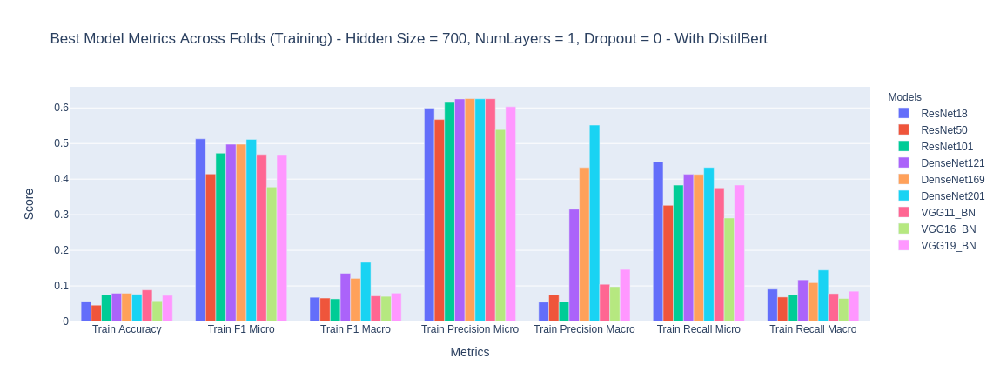

In [37]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0 - With DistilBert',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

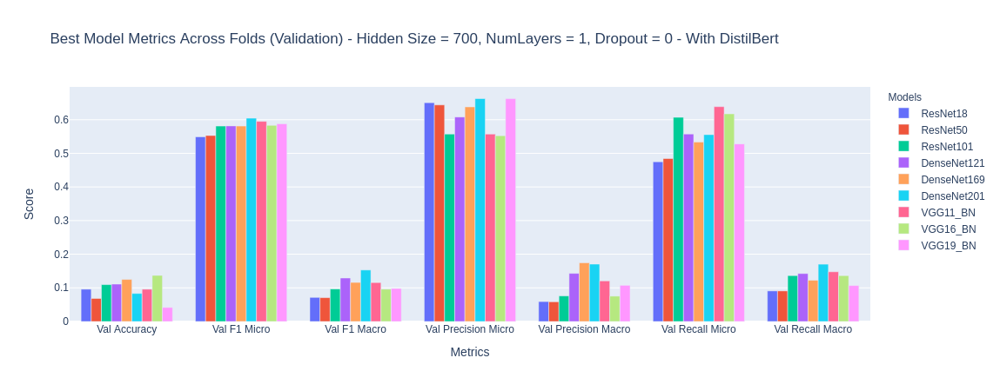

In [38]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0 - With DistilBert',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

# 
# 
# 